# Nuclear chromatin phenotypes of PBMCs distinguish control and cancer populations

---
This notebook summarizes the analysis corresponding to the results presented in figure 2 of the paper. It can be used to rerun the analysis and regenerate the corresponding panels.

---

## 0. Environmental setup

In [28]:
output_dir = "/home/paysan_d/Desktop/"

<IPython.core.display.Javascript object>

In [29]:
import pandas as pd
import numpy as np
import seaborn as sns
import random
import os
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
import matplotlib as mpl

mpl.rcParams["figure.dpi"] = 600

import sys

sys.path.append("../..")
from src.utils.notebooks.eda import *
from src.utils.notebooks.figure3 import *
from src.utils.notebooks.figure2 import *
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import cross_val_score, StratifiedGroupKFold

# SMALL_SIZE = 16
# MEDIUM_SIZE = 18
# BIGGER_SIZE = 20

# mpl.rc("font", size=SMALL_SIZE, weight="bold")  # controls default text sizes
# mpl.rc("axes", titlesize=SMALL_SIZE)  # fontsize of the axes title
# mpl.rc("axes", labelsize=MEDIUM_SIZE)  # fontsize of the x and y labels
# mpl.rc("xtick", labelsize=SMALL_SIZE)  # fontsize of the tick labels
# mpl.rc("ytick", labelsize=SMALL_SIZE)  # fontsize of the tick labels
# mpl.rc("legend", fontsize=SMALL_SIZE)  # legend fontsize
# mpl.rc("figure", titlesize=BIGGER_SIZE)  # fontsize of the figure title

seed = 1234
random.seed(1234)
np.random.seed(1234)

%reload_ext nb_black

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [30]:
import re


def sorted_nicely(l):
    """ Sort the given iterable in the way that humans expect."""
    convert = lambda text: int(text) if text.isdigit() else text
    alphanum_key = lambda key: [convert(c) for c in re.split("([0-9]+)", key)]
    return sorted(l, key=alphanum_key)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [31]:
nuc_feature_desc = pd.read_csv(
    "../../data/chrometric_feature_description.csv", index_col=0
)
feature_name_dict = dict(
    zip(
        list(nuc_feature_desc.loc[:, "feature"]),
        list(nuc_feature_desc.loc[:, "long_name"]),
    )
)
feature_color_dict = {
    "morphology": "b",
    "intensity": "g",
    "boundary": "r",
    "texture": "c",
    "chromatin condensation": "m",
    "moments": "y",
    np.nan: "k",
}
feature_color_dict = {
    feature: feature_color_dict[category]
    for (feature, category) in zip(
        list(nuc_feature_desc.loc[:, "long_name"]),
        list(nuc_feature_desc.loc[:, "category"]),
    )
}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [32]:
color_palette = {"Control": "mediumseagreen", "Cancer": "tomato"}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

## 1. Read in data

To assess the differences in the cancer populations compared to the control population, we obtained PBMCs of 10 healthy control samples and 10 cancer patients of various cancer types. For each patient we obtained a number of images of the PBMCs showing their DNA, gH2AX and Lamin A/C content using corresponding fluorescent stains.

First, we read in the required data set that describe each PBMCs by a number of hand-crafted features extracted from the fluorescent images of the cells.

In [33]:
hv_root_data_dir = "../../data/control/proteins/"
feature_file_path = "/preprocessed/full_pipeline/nuclear_features.csv"
qc_result_file_path = "/preprocessed/full_pipeline/segmentation/qc_results.csv"
gh2ax_foci_result_file_path = "/preprocessed/full_pipeline/gh2ax_foci_feats.csv"

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [34]:
hv_data = read_in_protein_dataset(
    data_dir=hv_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    gh2ax_foci_result_file_path=gh2ax_foci_result_file_path,
)
hv_data["id"] = hv_data["sample"] + hv_data["timepoint"]
hv_data["condition"] = "Control"
hv_data["file_name"] = np.array(list(hv_data.index))

Load data: 100%|██████████| 10/10 [00:00<00:00, 31.92it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [35]:
pancancer_root_data_dir = "../../data/pancancer/proteins/timepoint_1"

pancancer_data = read_in_protein_dataset(
    data_dir=pancancer_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    gh2ax_foci_result_file_path=gh2ax_foci_result_file_path,
)
pancancer_data["id"] = pancancer_data["sample"] + pancancer_data["timepoint"]
pancancer_data["condition"] = "Cancer"
pancancer_data["file_name"] = np.array(list(pancancer_data.index))

Load data: 100%|██████████| 10/10 [00:00<00:00, 18.83it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

## 2. Data preprocessing

Before we analyze the data, we will first preprocess it.

To this end, we first remove features with missing values and samples with missing features.

In [36]:
hv_data = preprocess_data(hv_data, remove_constant_features=False)
pancancer_data = preprocess_data(pancancer_data, remove_constant_features=False)
hv_data = hv_data.rename(columns=feature_name_dict)
pancancer_data = pancancer_data.rename(columns=feature_name_dict)

all_data = hv_data.append(pancancer_data)

Nuclei that did not pass the quality check: 191/2525. Remaining: 2334.
Removed 12 constant or features with missing values. Remaining: 273.
Removed additional 6 features. Remaining: 267.
Nuclei that did not pass the quality check: 262/5276. Remaining: 5014.
Removed 12 constant or features with missing values. Remaining: 273.
Removed additional 6 features. Remaining: 267.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [37]:
all_data = all_data.loc[~all_data.duplicated()]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

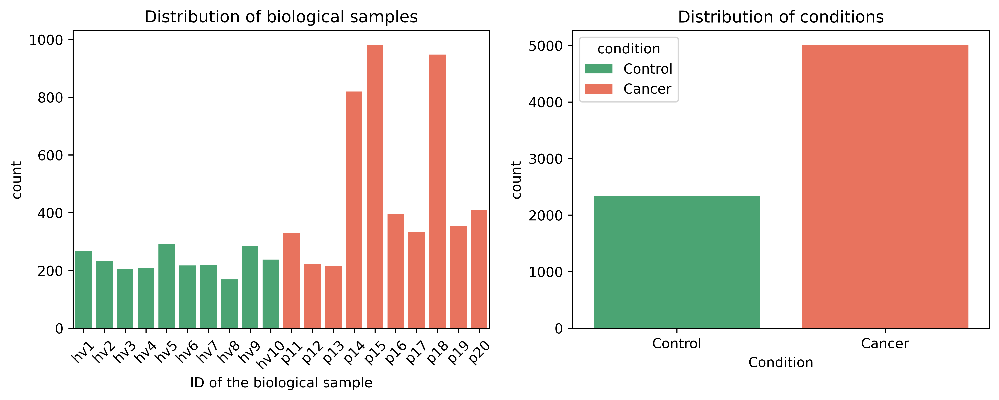

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [38]:
fig, ax = plt.subplots(figsize=[12, 4], ncols=2)
cond_order = ["Control", "Cancer"]
sample_order = sorted_nicely(np.unique(all_data.loc[:, "sample"]))
ax = ax.flatten()
ax[0] = sns.countplot(
    x="sample",
    data=all_data,
    ax=ax[0],
    order=sample_order,
    hue_order=cond_order,
    hue="condition",
    dodge=False,
    palette=color_palette,
)
ax[0].legend([], [], frameon=False)
ax[0].set_xlabel("ID of the biological sample")
ax[0].set_title("Distribution of biological samples")
for tick in ax[0].get_xticklabels():
    tick.set_rotation(45)

ax[1] = sns.countplot(
    x="condition",
    hue="condition",
    data=all_data,
    ax=ax[1],
    order=cond_order,
    dodge=False,
    palette=color_palette,
    hue_order=cond_order,
)
ax[1].set_xlabel("Condition")
ax[1].set_title("Distribution of conditions")

plt.show()
plt.close()

Note that while the data set consists of 10 cancer patients and 10 healthy controls the number of nuclei varies significantly between each biological sample.

___

#### Subsampling

We first subsample the data set such that for each condition (control vs. cancer) we have the same number of nuclei in the data set. Additionally, we ensure that for the cancer population we have approximately equal number of nuclei from each biological sample.

In [39]:
sampled_data = get_stratified_data(hv_data, pancancer_data)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

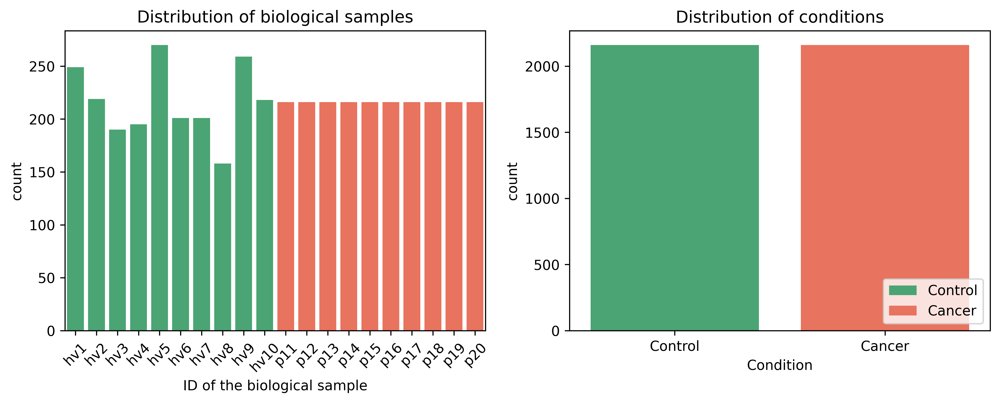

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [40]:
fig, ax = plt.subplots(figsize=[12, 4], ncols=2)
cond_order = ["Control", "Cancer"]
sample_order = sorted_nicely(np.unique(all_data.loc[:, "sample"]))
ax = ax.flatten()
ax[0] = sns.countplot(
    x="sample",
    data=sampled_data,
    ax=ax[0],
    order=sample_order,
    hue_order=cond_order,
    hue="condition",
    dodge=False,
    palette=color_palette,
)
ax[0].legend([], [], frameon=False)
ax[0].set_xlabel("ID of the biological sample")
ax[0].set_title("Distribution of biological samples")
for tick in ax[0].get_xticklabels():
    tick.set_rotation(45)

ax[1] = sns.countplot(
    x="condition",
    hue="condition",
    data=sampled_data,
    ax=ax[1],
    order=cond_order,
    dodge=False,
    palette=color_palette,
    hue_order=cond_order,
)
ax[1].set_xlabel("Condition")
ax[1].set_title("Distribution of conditions")
ax[1].legend(loc="lower right")

plt.show()
plt.close()

In [41]:
Counter(sampled_data.loc[:, "sample"])

Counter({'hv8': 158,
         'hv9': 259,
         'hv10': 218,
         'hv4': 195,
         'hv1': 249,
         'hv7': 201,
         'hv2': 219,
         'hv3': 190,
         'hv6': 201,
         'hv5': 270,
         'p11': 216,
         'p12': 216,
         'p13': 216,
         'p14': 216,
         'p15': 216,
         'p16': 216,
         'p17': 216,
         'p18': 216,
         'p19': 216,
         'p20': 216})

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

The sampled data set consists of 2160 nuclei from the healthy controls as well as from the cancer patients.

----

#### Sample and feature selection

We now filter out constant features and nuclei with missing features. We will do that for both replicates individually. However, we will also combine the two replicates to provide a joint analysis.

In [42]:
data = preprocess_data(sampled_data, remove_constant_features=True)

Nuclei that did not pass the quality check: 0/4320. Remaining: 4320.
Removed 4 constant or features with missing values. Remaining: 263.
Removed additional 0 features. Remaining: 263.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

#### Data preparation

After sampling the data, we will now prepare the data for the consecutive analysis, i.e. extracting only chrometric features and corresponding metadata information.

In [43]:
all_chrometric_data = get_chrometric_data(
    data,
    proteins=["gh2ax", "lamin"],
    exclude_dna_int=True,
)

sample_labels = data.loc[:, "sample"]
cond_labels = data.loc[:, "condition"]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Finally, we remove highly correlated features (Pearson $\rho > 0.8$) from the chrometric features.

In [44]:
chrometric_data = remove_correlated_features(all_chrometric_data, threshold=0.8)

Removed 144/192 features with a Pearson correlation above 0.8. Remaining: 48


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

## 3. Panels

Now we generate the individual panels for figure 2 of the paper.


### 3a. Visualization of the global nuclear phenotypes of control vs cancer population

In [45]:
# sns.heatmap(
#     StandardScaler().fit_transform(chrometric_data)[:10],
#     vmin=-2,
#     vmax=2,
#     cmap="seismic",
# )

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

First, we provide a visual representation of the different nuclear phenotypes in health and cancer. To this end, we will randomly sample 36 nuclei from each condition and plot a corresponding montage of the max-z projected DNA images. To visualize size differences each nuclei is padded to a size of 150x150 pixels.

In [46]:
image_file_path = "preprocessed/full_pipeline/segmentation/nuclei_images"
sampled_ctrl_images = get_random_images(
    data.loc[data.condition == "Control"],
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
)

sampled_cancer_images = get_random_images(
    data.loc[data.condition == "Cancer"],
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Control population

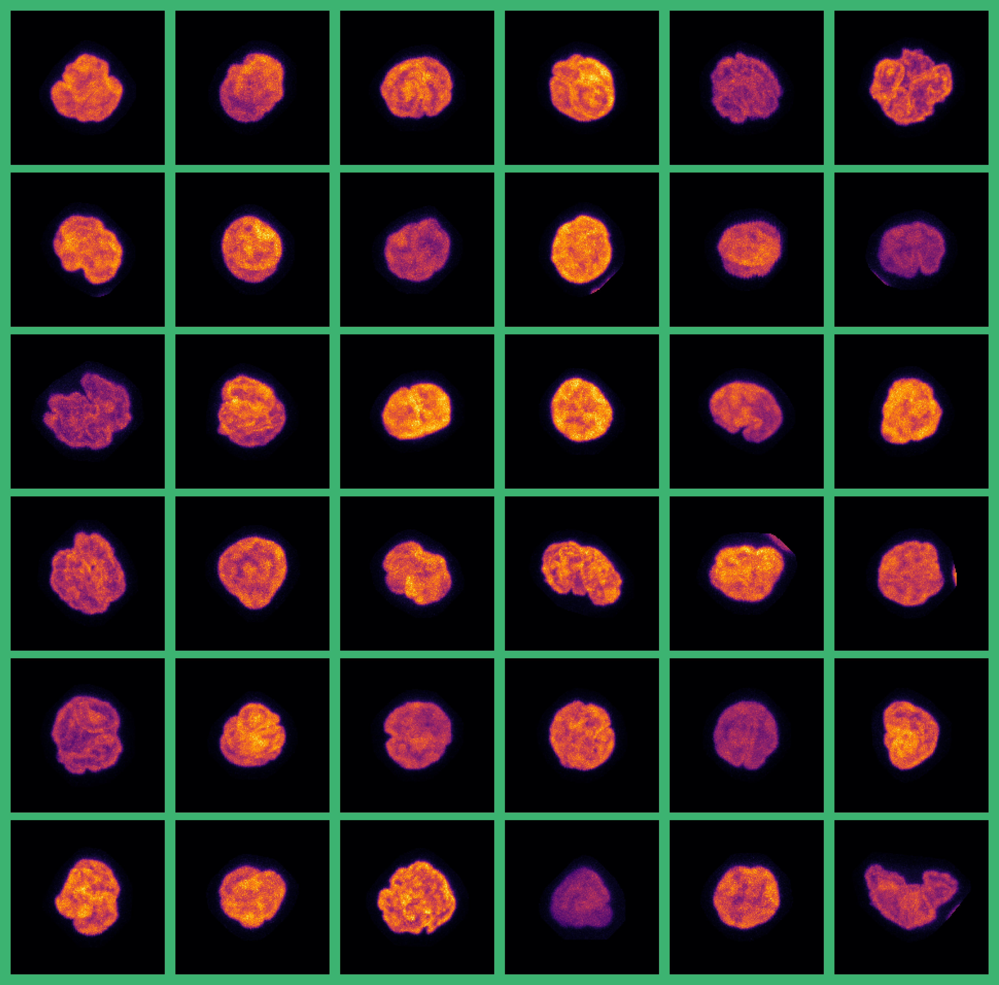

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [47]:
fig_ctrl, ax_ctrl = plot_montage(
    sampled_ctrl_images, pad_size=150, cmap="inferno", channel_first=False
)
fig_ctrl.set_facecolor(color_palette["Control"])

#### Cancer population

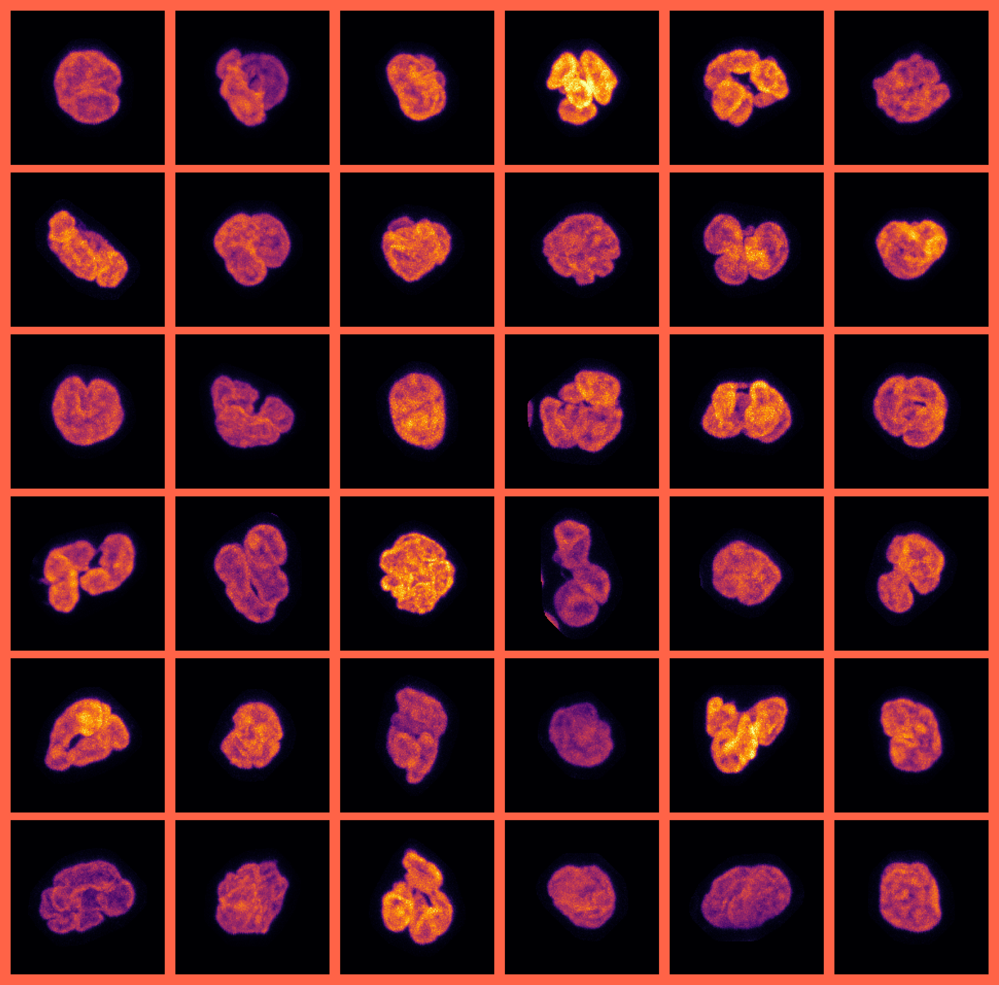

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [48]:
fig_cancer, ax_cancer = plot_montage(
    sampled_cancer_images, pad_size=150, cmap="inferno", channel_first=False
)
fig_cancer.set_facecolor(color_palette["Cancer"])

The above montages show that the nuclei of the cancer samples often feature a signficantly different chrometric phenotype compared to those of PBMCs from the healthy controls. For instance we observe a frequent fragmentation of the nucleus which leads to highly concave nuclear shape.

---

### 3b. Parametric analysis captures large-scale differences between control and cancer population

We will now use the chrometric features to describe the nuclear phenotype of the PBMCs in the two conditions and assess their differences. To this end, we first visualize the data set using a tSNE plot to visualize the high-dimensional data set in 2D and show the large-scale differences of the chrometric phenotypes of PBMCs in healthy and cancer subjects respectively.

In [49]:
chrometric_embs = get_tsne_embs(chrometric_data)
chrometric_embs["condition"] = np.array(cond_labels)
chrometric_embs["sample"] = np.array(sample_labels)

/home/paysan_d/miniconda3/envs/icp/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

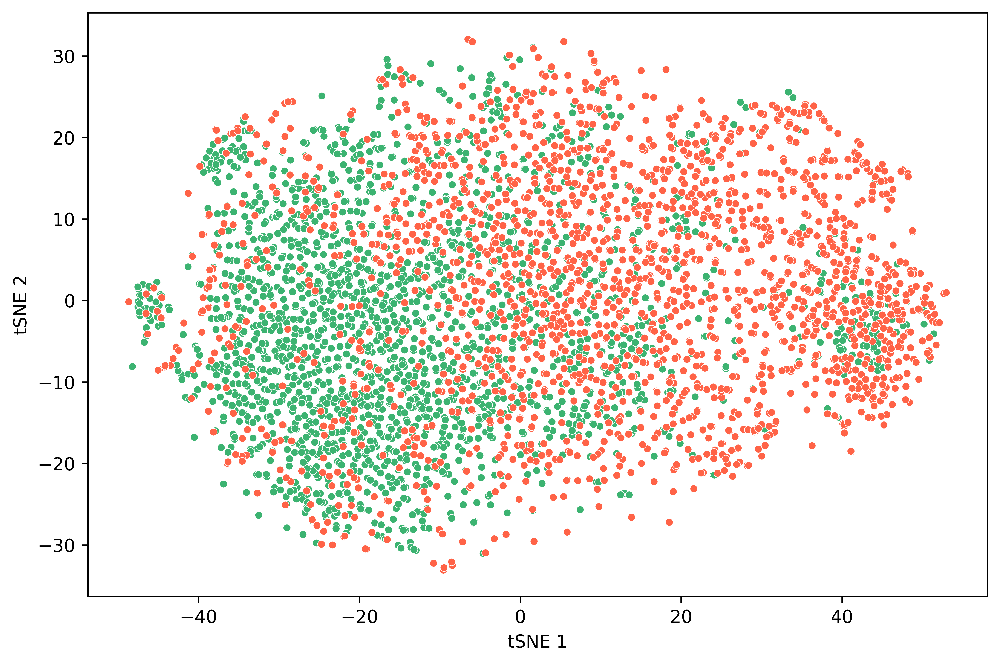

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [50]:
fig, ax = plt.subplots(figsize=[9, 6])
ax = sns.scatterplot(
    data=chrometric_embs,
    x="tSNE 1",
    y="tSNE 2",
    hue="condition",
    hue_order=cond_order,
    ax=ax,
    s=18,
    marker="o",
    palette=color_palette,
    legend=False,
)
# plt.legend()
# fig.savefig(
#     os.path.join(output_dir, "ctrl_cancer_tsne.png"), dpi=1200, transparent=True
# )
plt.show()

In [51]:
# fig, ax = plt.subplots(figsize=[3, 2])
# ax = sns.scatterplot(
#     data=chrometric_embs.iloc[
#         np.random.choice(list(range(len(chrometric_embs))), 1000)
#     ],
#     x="tSNE 1",
#     y="tSNE 2",
#     hue="condition",
#     hue_order=cond_order,
#     ax=ax,
#     s=8,
#     marker="o",
#     palette=color_palette,
#     legend=False,
# )
# ax.axis("off")
# plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [52]:
# fig, ax = plt.subplots(figsize=[2, 2])
# ax = sns.boxplot(
#     data=data,
#     x="condition",
#     y="glcm_contrast_5px",
#     hue="condition",
#     hue_order=cond_order,
#     ax=ax,
#     palette=color_palette,
#     width=0.8,
#     dodge=False,
#     fliersize=1,
# )
# ax.axis("off")
# ax.get_legend().remove()
# plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Healthy controls

In [53]:
control_chrometric_feats = chrometric_data.loc[
    cond_labels.loc[cond_labels == "Control"].index
]
control_sample_labels = sample_labels.loc[
    cond_labels.loc[cond_labels == "Control"].index
]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Visually, we do not see any strong batch/patient-specific effects. We can further quantify that by clustering the nuclei of the healthy control population using a Gaussian Mixture clustering approach. We then validate that for each sample the conditional distribution over the identified clusters is approximately the same. Thereby, we identify the optimal number of clusters by the choice that minimizes the BIC criterion when using a full covariance structure and upper bounding the number of clusters by the number of samples/patients.

The row-normalized co-occurence matrix that visualizes the conditional distributions for each sample/patient is shown below.

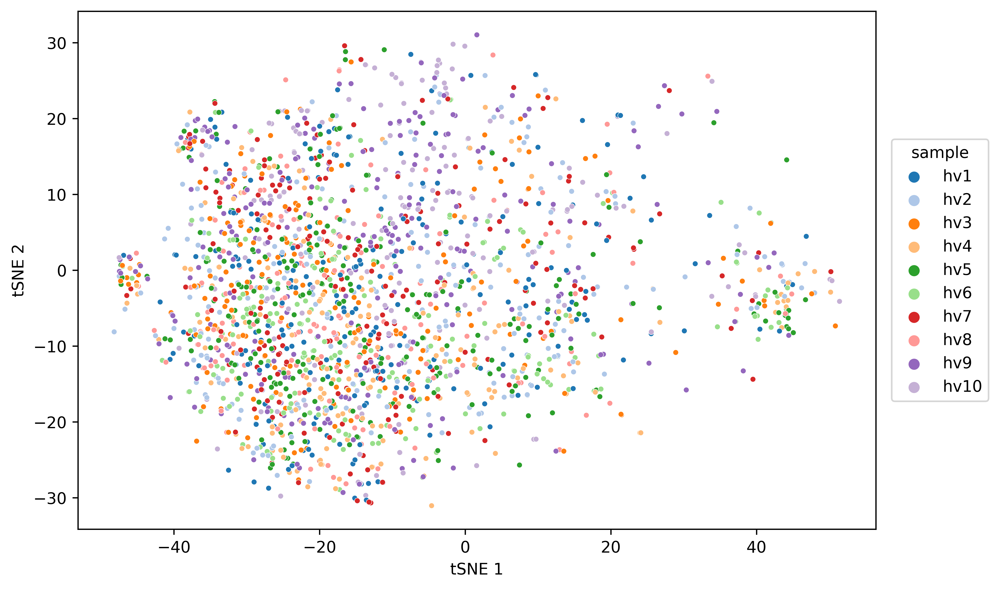

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [54]:
fig, ax = plt.subplots(figsize=[9, 6])
ax = sns.scatterplot(
    data=chrometric_embs.loc[chrometric_embs.condition == "Control"],
    x="tSNE 1",
    y="tSNE 2",
    hue="sample",
    hue_order=sample_order[:10],
    ax=ax,
    s=12,
    marker="o",
    palette=sns.color_palette("tab20", 20)[:10],
)
plt.legend(
    bbox_to_anchor=(1.02, 0.5), loc="center left", borderaxespad=0, title="sample"
)
plt.show()

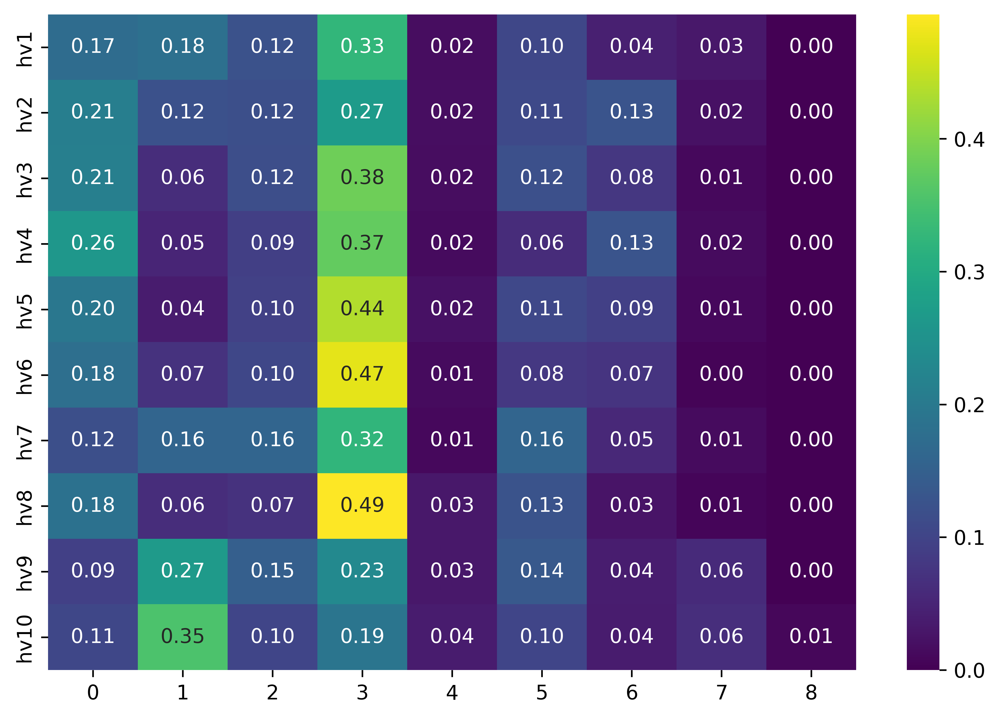

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [55]:
fig, ax = plt.subplots(figsize=[9, 6])
sample_cluster_count_mtx = get_batch_gmm_cluster_count_mtx(
    control_chrometric_feats, control_sample_labels
).loc[sample_order[:10]]
ax = sns.heatmap(sample_cluster_count_mtx, annot=True, fmt=".2f", ax=ax, cmap="viridis")

#### Cancer patients

In [56]:
cancer_chrometric_feats = chrometric_data.loc[
    cond_labels.loc[cond_labels != "Control"].index
]
cancer_sample_labels = sample_labels.loc[
    cond_labels.loc[cond_labels != "Control"].index
]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

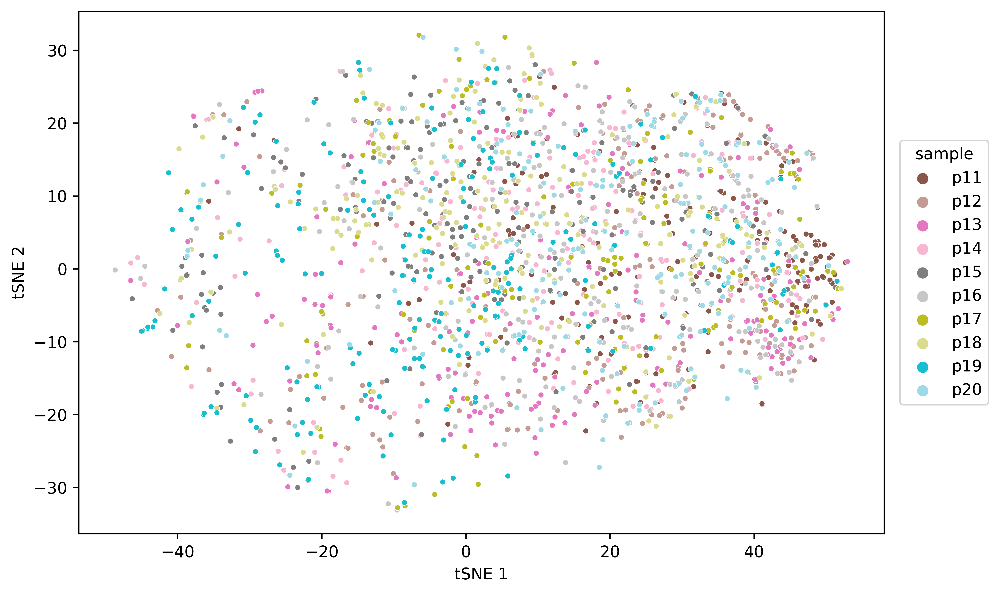

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [57]:
fig, ax = plt.subplots(figsize=[9, 6])
ax = sns.scatterplot(
    data=chrometric_embs.loc[chrometric_embs.condition == "Cancer"],
    x="tSNE 1",
    y="tSNE 2",
    hue="sample",
    hue_order=sample_order[10:],
    ax=ax,
    s=12,
    marker="o",
    palette=sns.color_palette("tab20", 20)[10:],
)
plt.legend(
    bbox_to_anchor=(1.02, 0.5), loc="center left", borderaxespad=0, title="sample"
)
plt.show()

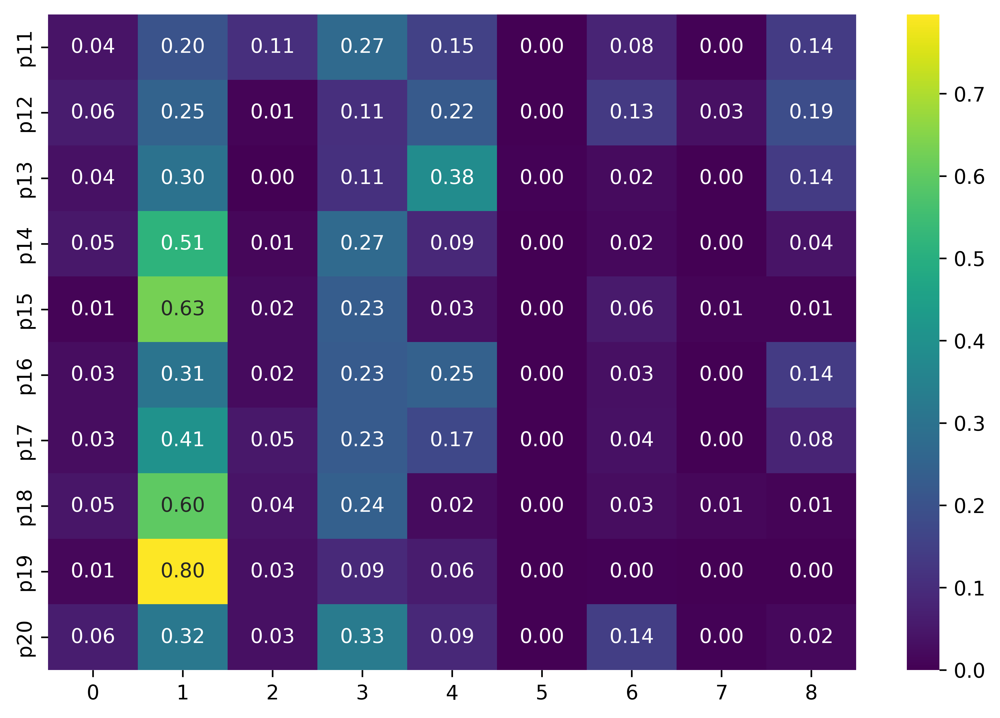

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [58]:
fig, ax = plt.subplots(figsize=[9, 6])
sample_cluster_count_mtx = get_batch_gmm_cluster_count_mtx(
    cancer_chrometric_feats, cancer_sample_labels
).loc[sample_order[10:]]

ax = sns.heatmap(sample_cluster_count_mtx, annot=True, fmt=".2f", ax=ax, cmap="viridis")

---

#### Classification of the control resp. cancer PBMCs

To quantify the separability of the two conditions we perform a 10-fold stratified cross-validation analysis using a RandomForest classifier. The classifier provides a simple non-linear classification model which also yields an importance measure for the individual chrometric features indicating which ones are most different between the two populations.

In [59]:
rfc = RandomForestClassifier(
    n_estimators=500, n_jobs=10, random_state=seed, class_weight="balanced"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##### Nuclei split

At first we will split the data randomly on a nuclei-basis, i.e. nuclei of the same biological sample will be likely included in both the training and the test sets.

In [60]:
cond_cv_conf_mtx_nuclei = get_cv_conf_mtx(
    estimator=rfc,
    features=chrometric_data,
    labels=cond_labels,
    scale_features=False,
    n_folds=10,
    order=cond_order,
)
normalized_cv_conf_mtx_nuclei = cond_cv_conf_mtx_nuclei.divide(
    cond_cv_conf_mtx_nuclei.sum(axis=1), axis=0
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

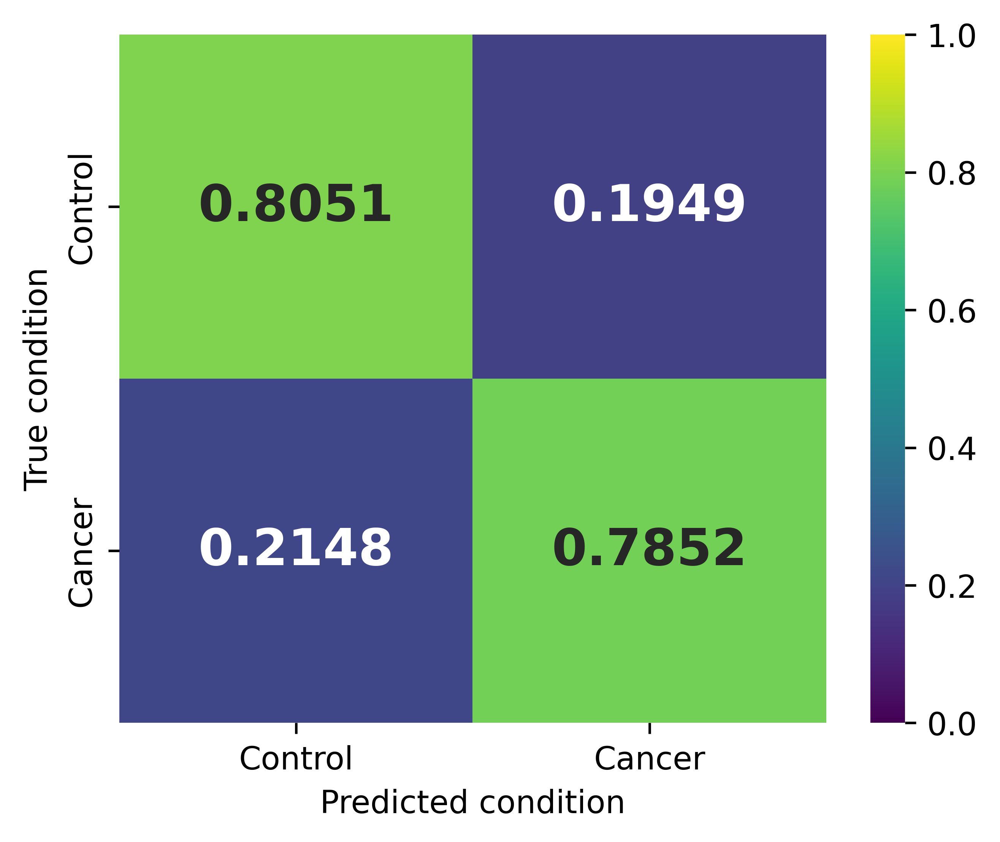

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [61]:
fig, ax = plt.subplots(figsize=[5, 4])
ax = sns.heatmap(
    normalized_cv_conf_mtx_nuclei,
    annot=True,
    fmt=".4f",
    cmap="viridis",
    vmin=0,
    vmax=1,
    # cbar=False,
    annot_kws={"size": 16, "fontweight": "bold"},
)
ax.set_xlabel("Predicted condition")
ax.set_ylabel("True condition")
# fig.savefig(
#     os.path.join(output_dir, "ctrl_cancer_conf_mtx.png"), dpi=1200, transparent=True
# )
plt.show()

The classifier is able to accurately distinguish nuclei from the control and cancer population. This suggests that there are large differences with respect to the chrometric phenotypes of PBMCs in the absence compared to in the presence of cancer. While the tSNE plot already suggested that this is the case, a linear discriminant analysis shows that using a linear combination of the chrometric features the two classes can be accurately distinguished.

In [62]:
lda = LinearDiscriminantAnalysis(n_components=1)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [63]:
lda_cond_cv_conf_mtx_nuclei = get_cv_conf_mtx(
    estimator=lda,
    features=chrometric_data,
    labels=cond_labels,
    scale_features=True,
    n_folds=10,
    order=cond_order,
)
lda_normalized_cv_conf_mtx_nuclei = lda_cond_cv_conf_mtx_nuclei.divide(
    lda_cond_cv_conf_mtx_nuclei.sum(axis=1), axis=0
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

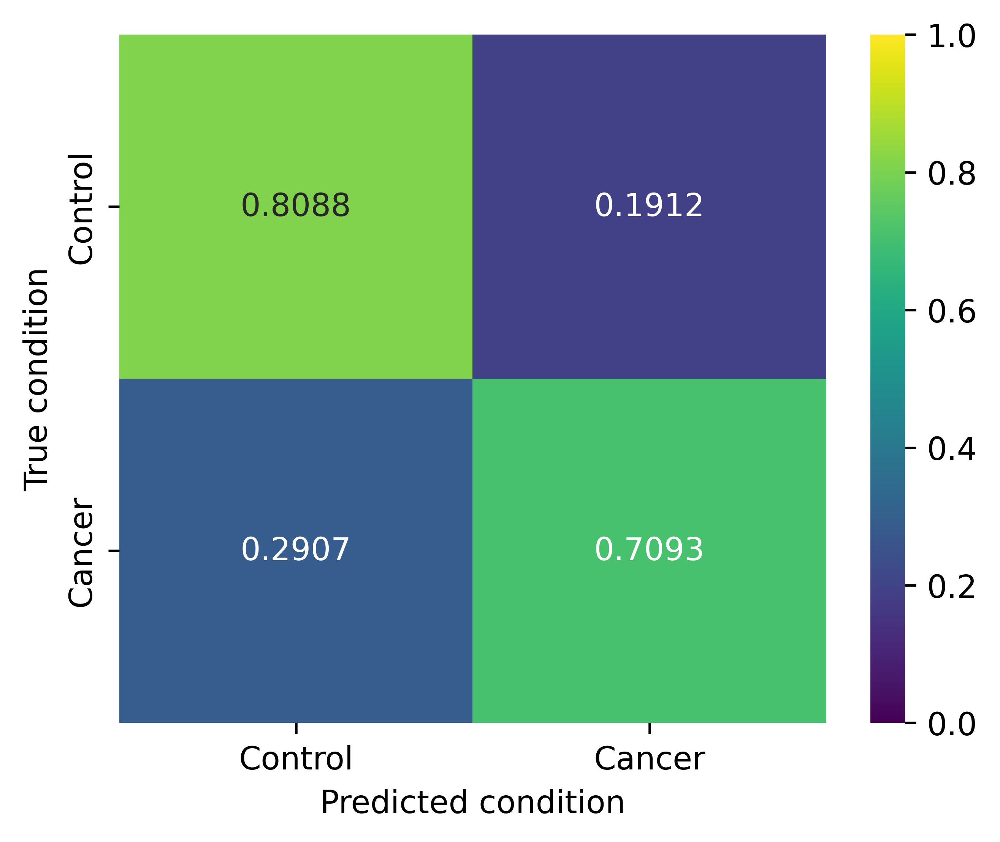

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [64]:
fig, ax = plt.subplots(figsize=[5, 4])
ax = sns.heatmap(
    lda_normalized_cv_conf_mtx_nuclei,
    annot=True,
    fmt=".4f",
    cmap="viridis",
    vmin=0,
    vmax=1,
    # cbar=False,
)
ax.set_xlabel("Predicted condition")
ax.set_ylabel("True condition")
plt.show()

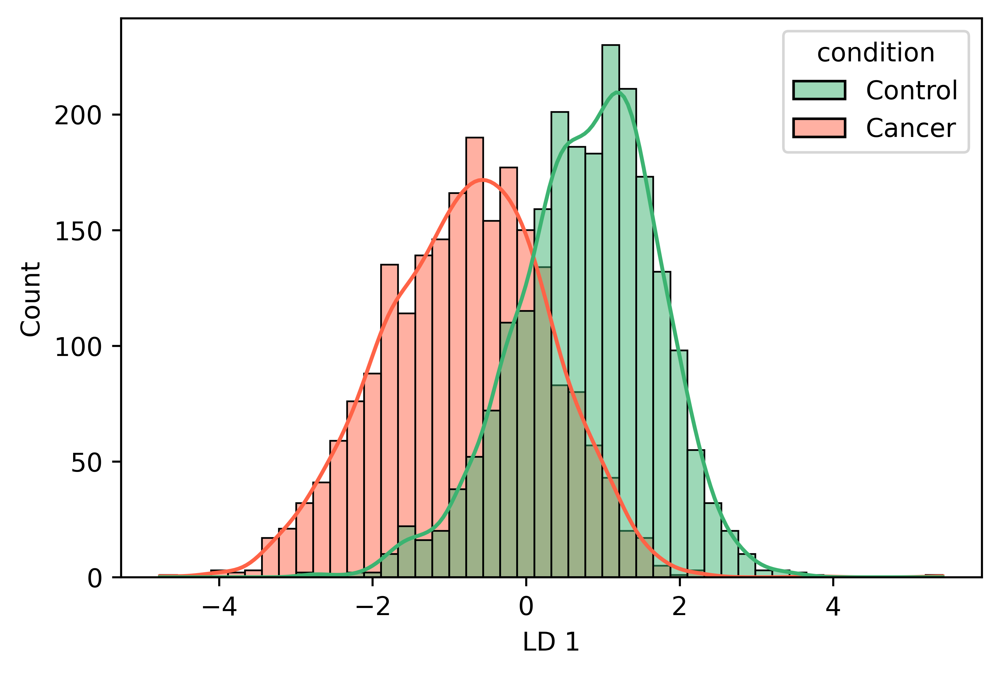

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [65]:
lda_transformed = pd.DataFrame(
    lda.fit(chrometric_data, cond_labels).transform(chrometric_data),
    columns=["LD 1"],
    index=chrometric_data.index,
)
lda_transformed["condition"] = np.array(cond_labels)
lda_transformed["sample"] = np.array(sample_labels)
fig, ax = plt.subplots(figsize=[6, 4])
ax = sns.histplot(
    data=lda_transformed,
    x="LD 1",
    hue="condition",
    hue_order=cond_order,
    palette=color_palette,
    kde=True,
)

---
#### Patient split


While the previous analysis assess the level of differences of the chrometric phenotypes of the PBMCs between the control and cancer population, the classifier can make use of patient specific characteristics during the classification. In a diagnostic use case such information would not be available. To evaluate how well a classifier would be able to predict for unseen patient the corresponding condition simply based on the chrometric phenotypes of the PBMCs, we also assess the class separability using a stratified 10-fold patient-cross-validation approach. Thereby at each iteration 2 of the patients of each condition (healthy control and cancer) are hold out for the test set.

In [66]:
cond_cv_conf_mtx_patient = get_cv_conf_mtx(
    estimator=rfc,
    features=chrometric_data,
    labels=cond_labels,
    groups=sample_labels,
    scale_features=False,
    n_folds=20,
    order=cond_order,
    balance_train=True,
)
normalized_cv_conf_mtx_patient = cond_cv_conf_mtx_patient.divide(
    cond_cv_conf_mtx_patient.sum(axis=1), axis=0
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

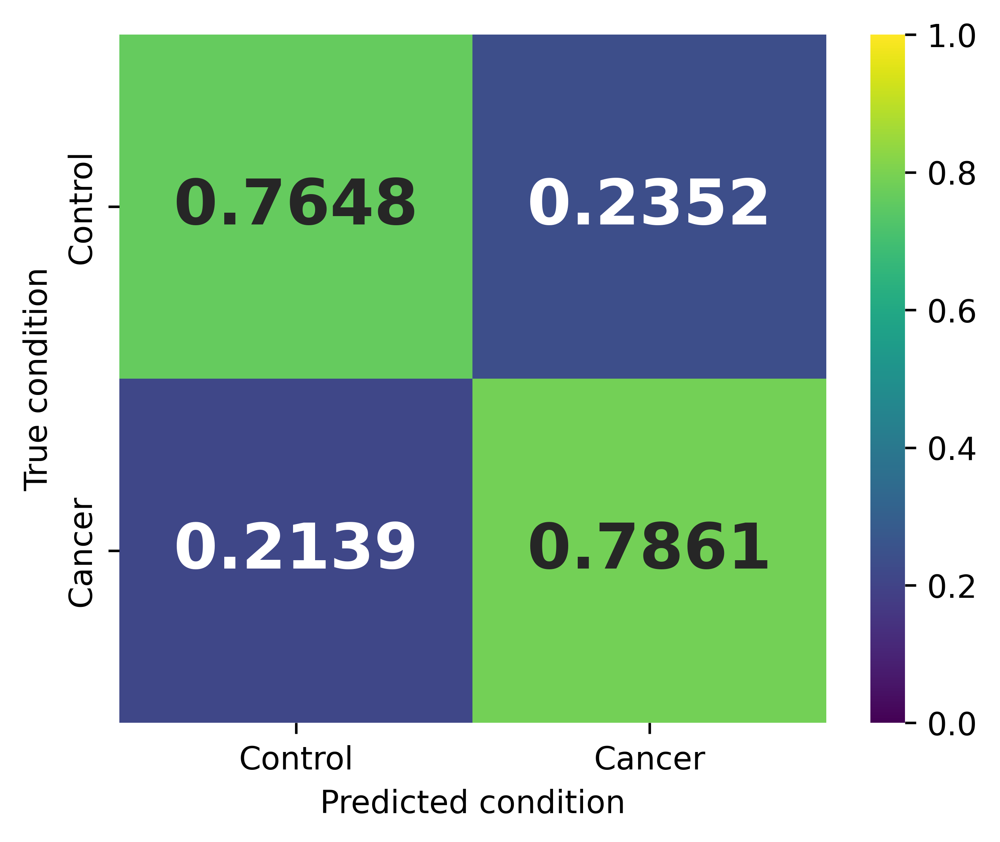

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [67]:
fig, ax = plt.subplots(figsize=[5, 4])
ax = sns.heatmap(
    normalized_cv_conf_mtx_patient,
    annot=True,
    fmt=".4f",
    cmap="viridis",
    vmin=0,
    vmax=1,
    # cbar=False,
    annot_kws={"size": 20, "weight": "bold"},
)
ax.set_xlabel("Predicted condition")
ax.set_ylabel("True condition")
# fig.savefig(
#     os.path.join(output_dir, "ctrl_cancer_conf_mtx.png"), dpi=1200, transparent=True
# )
plt.show()

In [68]:
groupkfold = StratifiedGroupKFold(n_splits=10)
cv_bacs = cross_val_score(
    rfc,
    cv=groupkfold,
    X=chrometric_data,
    y=cond_labels,
    groups=sample_labels,
    scoring="balanced_accuracy",
    n_jobs=10,
)
print("Balanced accuracy: {} (+/- {})".format(np.mean(cv_bacs), np.std(cv_bacs)))

Balanced accuracy: 0.772182267654106 (+/- 0.07206165015650298)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

##### Leave-one-patient out cross-validation

In addition to the previous study we run a leave-one-patient out cross-validation in order to characterize how the individual patients contribute to the separability of the cancer and the control population. In particular, we are interested in patients whose representative PBMC population is particularly accurate or inaccurate classified when the classifier is trained on the data of all other patients. Note that to avoid class imbalance, at each iteration were we leave out patient with a specific cancer type, we take a balanced random subsample among the PBMC population of all other patients for training such that each cancer type is equally represented.

In [77]:
lopo_cv_result = summarize_group_cv_results_by_fold(
    model=rfc,
    features=chrometric_data,
    labels=cond_labels,
    groups=sample_labels,
    balance_train=True,
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

To compare the performance to a random baseline and thus be able to assess if the classification performance is significantly better than random chance. We repeat that procedure 10 times when we randomly permute the cancer types of the individual patients before hand.

In [79]:
np.random.seed(seed)
bs = range(10)

lopo_perm_cv_results = []

for b in tqdm(bs):
    perm_cond_labels = get_permute_group_labels(cond_labels, sample_labels)[0]
    lopo_perm_cv_result = summarize_group_cv_results_by_fold(
        model=rfc,
        features=chrometric_data,
        labels=perm_cond_labels,
        groups=sample_labels,
        balance_train=True,
    )
    lopo_perm_cv_result["permutation"] = b
    lopo_perm_cv_results.append(lopo_perm_cv_result)
lopo_perm_cv_results = pd.concat(lopo_perm_cv_results)

  0%|          | 0/10 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [80]:
lopo_perm_cv_results["condition"] = "Permuted"
lopo_cv_result["condition"] = "Observed"
all_lopo_results = lopo_cv_result.append(lopo_perm_cv_results)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

We will now jointly plot the performance measured by the (balanced) accuracy score for each sample and thereby distinguish between the scores obtained with and without permuting the cancer labeles.

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Cancer_Observed vs. Cancer_Permuted: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.229e-05 U_stat=9.210e+02
Control_Observed vs. Control_Permuted: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.712e-05 U_stat=9.140e+02


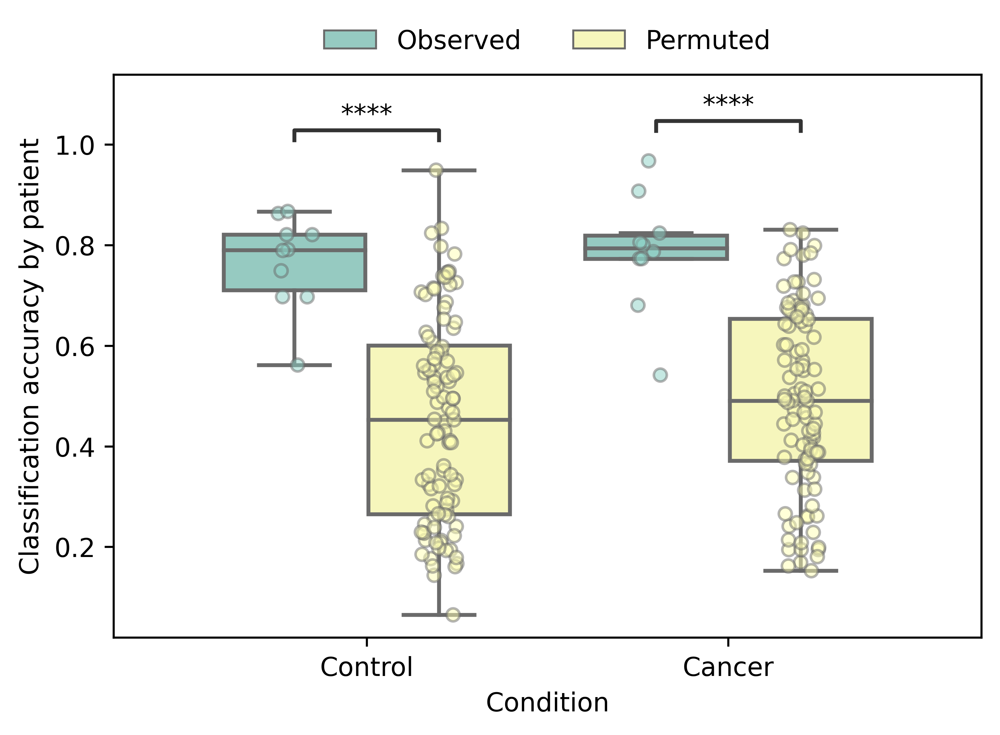

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [82]:
fig, ax = plot_lopo_cv_results_by_class(
    all_lopo_results,
    cond_order,
    x="majority_class",
    y="score",
    hue="condition",
    figsize=[6, 4],
    test="Mann-Whitney",
    pval_text_format="star",
    alpha=0.5,
)
ax.set_xlabel("Condition")
ax.set_ylabel("Classification accuracy by patient")
plt.show()

The above plot validates that the performance in both conditions is signficantly higher than what we expect by random chance. However, we also notice that there are is one healthy control and and one cancer patients for which just roughly 50% of all PBMCs are correctly classified by the Random Forest model. This is also shown in bar plot below.

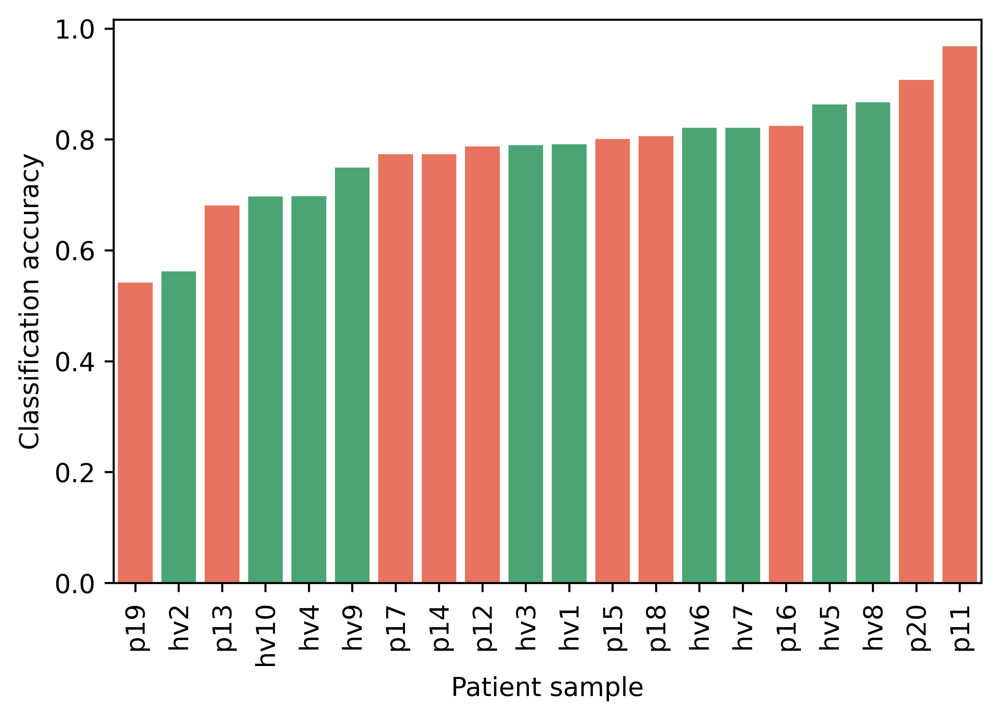

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [83]:
fig, ax = plt.subplots(figsize=[6, 4])
sample_colors = [
    color_palette[k] for k in list(lopo_cv_result.loc[:, "majority_class"])
]
sample_palette = dict(zip(list(lopo_cv_result.loc[:, "group"]), sample_colors))
ax = sns.barplot(
    data=lopo_cv_result,
    x="group",
    y="score",
    palette=sample_palette,
    order=list(lopo_cv_result.sort_values("score").loc[:, "group"]),
)
plt.xticks(rotation=90)
ax.set_xlabel("Patient sample")
ax.set_ylabel("Classification accuracy")
plt.show()

The two patients in question are healthy control HV2 and cancer patient P19, note that importantly for those samples the prediction probability of the true condition is fairly close two 50% emphasizing the difficulty of the classifier to identify the condition of those two samples.

In [84]:
lopo_cv_result.sort_values("score").head(2)

,group,score,avg_max_pred_prob,avg_true_class_pred_prob,majority_class,majority_predicted_class,condition
11,p19,0.541667,0.677015,0.510345,Cancer,Cancer,Observed
2,hv2,0.561644,0.679939,0.558597,Control,Control,Observed


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Finally, we will plot the overall performance of the leave one out cross-validation approach against the random background which we obtained by permuting the condition labels. Note that we color individual points corresponding to individual samples based on the average prediction performance of the actual condition.

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Observed vs. Permuted: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.385e-10 U_stat=3.678e+03


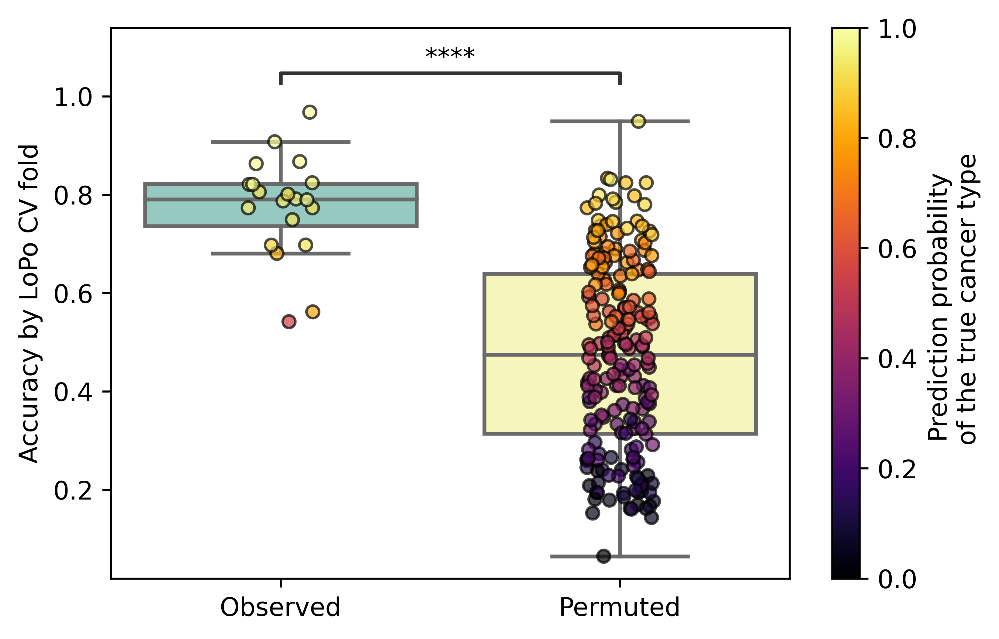

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [85]:
fig, ax = plot_lopo_cv_results(
    data=all_lopo_results,
    alpha=0.7,
    cbar_label="Prediction probability \n of the true cancer type",
)
ax.set_xlabel("")
ax.set_ylabel("Accuracy by LoPo CV fold")
plt.show()

---

#### Effect of chemotherapy

In the previous analyses all 10 cancer patients wre used. However, five of those patients namely P11, P13, P14, P16 and P17 have undergone chemotherapy prior to the proton therapy treatment respectively in the case of P16 started chemotherapy in addition to the proton therapy treatment.

We will now check if there exist strong differences between these two cancer population, which could confound the analyses.

In [94]:
additional_therapy_labels = np.array(["No treatment"] * len(cond_labels))
ct_patients = ["p11", "p13", "p14", "p16", "p17"]
for patient in ct_patients:
    additional_therapy_labels[sample_labels == patient] = "Chemotherapy"
additional_therapy_labels = pd.Series(
    additional_therapy_labels, index=cond_labels.index
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [95]:
cancer_chrometric_data = chrometric_data.loc[cond_labels == "Cancer"]
therapy_labels = additional_therapy_labels.loc[cancer_chrometric_data.index]
cancer_sample_labels = sample_labels.loc[cancer_chrometric_data.index]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [96]:
cond_cv_conf_mtx_patient_ct = get_cv_conf_mtx(
    estimator=rfc,
    features=cancer_chrometric_data,
    labels=therapy_labels,
    groups=cancer_sample_labels,
    scale_features=False,
    n_folds=5,
    order=["No treatment", "Chemotherapy"],
)
normalized_cv_conf_mtx_patient_ct = cond_cv_conf_mtx_patient_ct.divide(
    cond_cv_conf_mtx_patient_ct.sum(axis=1), axis=0
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

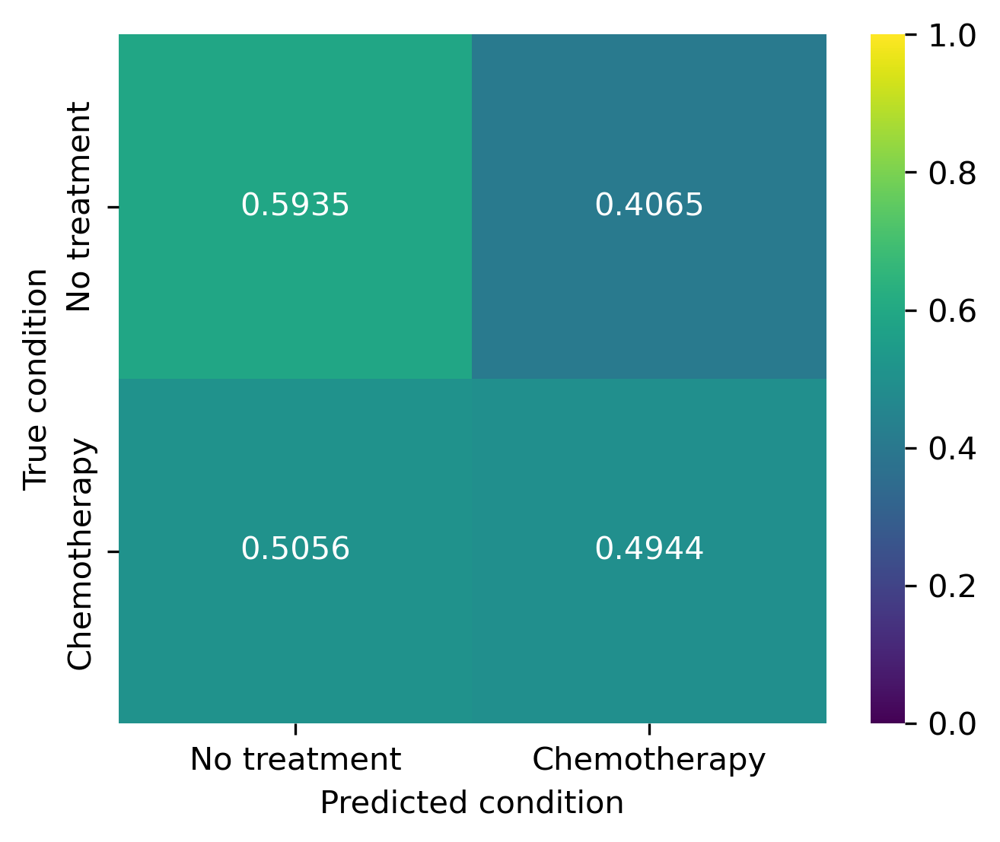

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [97]:
fig, ax = plt.subplots(figsize=[5, 4])
ax = sns.heatmap(
    normalized_cv_conf_mtx_patient_ct,
    annot=True,
    fmt=".4f",
    cmap="viridis",
    vmin=0,
    vmax=1,
    # cbar=False,
)
ax.set_xlabel("Predicted condition")
ax.set_ylabel("True condition")
plt.show()

In [98]:
groupkfold = StratifiedGroupKFold(n_splits=5)
cv_bacs = cross_val_score(
    rfc,
    cv=groupkfold,
    X=cancer_chrometric_data,
    y=therapy_labels,
    groups=cancer_sample_labels,
    scoring="balanced_accuracy",
    n_jobs=5,
)
print("Balanced accuracy: {} (+/- {})".format(np.mean(cv_bacs), np.std(cv_bacs)))

Balanced accuracy: 0.5439814814814815 (+/- 0.09256944155020233)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

### 3c. Nuclear chromatin biomarkers identifying cancer populations


#### Feature importance

After having validated that there are significant differences between the control and the cancer population with respect to the chrometric pheontypes of the PBMCS, we next assess the implicit feature importance of a RandomForest classifier trained on the task to distinguish between control and cancer samples in order to get an idea of the features which are most indicative of the cancer condition.

In [115]:
def plot_feature_importance(
    importance,
    names,
    model_type,
    figsize=[6, 4],
    cmap=["gray"],
    n_features=10,
    feature_color_dict=None,
    labelsize=6,
):
    # Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    # Create a DataFrame using a Dictionary
    data = {"feature_names": feature_names, "feature_importance": feature_importance}
    fi_df = pd.DataFrame(data)

    # Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=["feature_importance"], ascending=False, inplace=True)
    fi_df = fi_df.head(n_features)
    # Define size of bar plot
    fig, ax = plt.subplots(figsize=figsize)
    # Plot Searborn bar chart
    ax = sns.barplot(
        y=fi_df["feature_importance"], x=fi_df["feature_names"], palette=cmap, ax=ax
    )
    if feature_color_dict is not None:
        for xticklabel in ax.get_xticklabels():
            xticklabel.set_color(feature_color_dict[xticklabel.get_text()])
            xticklabel.set_rotation(90)
    ax.tick_params(axis="x", labelsize=labelsize)
    ax.tick_params(axis="y", labelsize=labelsize)

    # xticklabel.set_ha("right")
    # Add chart labels
    ax.set_title(model_type + "FEATURE IMPORTANCE")
    ax.set_xlabel("")
    ax.set_ylabel("")
    return fig, ax

<IPython.core.display.Javascript object>

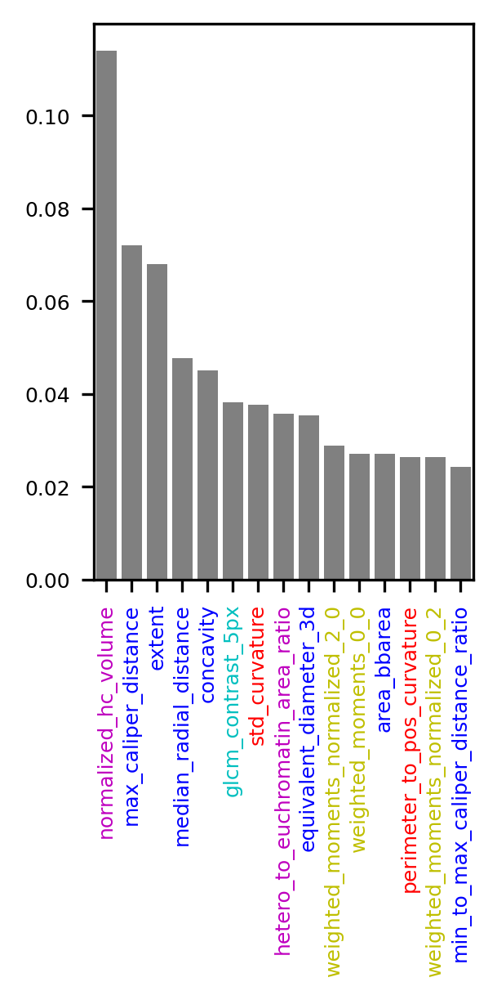

<IPython.core.display.Javascript object>

In [116]:
fig, ax = plot_feature_importance_for_estimator(
    rfc,
    chrometric_data,
    cond_labels,
    scale_features=False,
    cmap=["gray"],
    figsize=[2, 3],
    feature_color_dict=feature_color_dict,
    n_features=15,
)

The analysis suggests that the heterochromatin content, the size of the nucleus, its shape as well as the DNA intensity distribution of the DNA inside the nucleus are altered in the cancer population.

---

### 3c. Nuclear chromatin biomarkers identifying cancer populations

While the previously shown feature importance plots already suggest a number of candidate chrometric biomarkers that capture the differences of the nuclear phenotypes of the PBMCs in the different cancer types, we run marker screen by testing for differential distributions of the individual chrometric features between the control and cancer population. To this end, we apply a t-test to test for difference in the means and adjust for multiple testing using the Benjamini-Hochberg procedure.

In [118]:
marker_screen_results = find_markers(chrometric_data, cond_labels)

Run marker screen:   0%|          | 0/2 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

In [119]:
marker_screen_results.loc[marker_screen_results.label == "Cancer"].head(10)

,label,marker,fc,abs_delta_fc,pval,pval_adjust
1,Cancer,max_caliper_distance,1.108021,0.108021,2.322122e-234,1.114619e-232
46,Cancer,normalized_hc_volume,1.078269,0.078269,1.901160e-193,4.562785e-192
45,Cancer,extent,0.894081,0.105919,1.076734e-191,1.722774e-190
4,Cancer,median_radial_distance,1.057727,0.057727,4.999315e-152,5.999178e-151
5,Cancer,concavity,1.479380,0.479380,1.193264e-137,1.145533e-136
7,Cancer,std_curvature,1.173482,0.173482,6.442324e-123,5.153859e-122
29,Cancer,weighted_moments_normalized_2_2,1.380685,0.380685,1.056327e-104,7.243384e-104
15,Cancer,hetero_to_euchromatin_area_ratio,1.185013,0.185013,2.379265e-104,1.427559e-103
6,Cancer,area_bbarea,0.963066,0.036934,1.423823e-95,7.593724e-95
2,Cancer,min_to_max_caliper_distance_ratio,0.939063,0.060937,2.484742e-78,1.192676e-77


<IPython.core.display.Javascript object>

We find that the most significantly different features are a number of size features such as the maximum caliper and median radius, as well as features related to the curvature of the nucleus and the intranuclear chromatin compaction in the (rel_hc_volume and kurtosis) as well as the nuclear shape related (extent)

---

As a joint proxy to study the alterations in size, we focus at the nuclear volume, the variation in the shape by the concavity as well as the aspect ratio of the nucleus and the change in chromatin compaction by the relative heterochromatin to euchromatin ratio.

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:5.404e-74 t=-1.858e+01


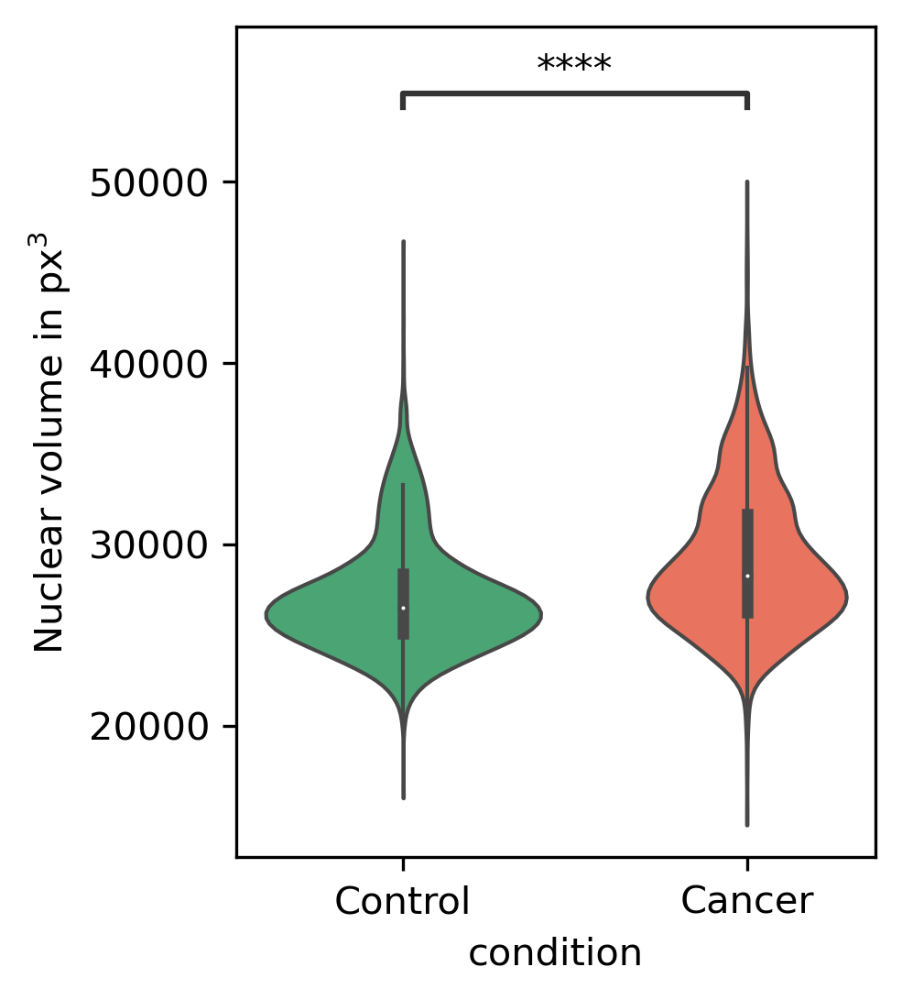

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:3.846e-195 t=-3.141e+01


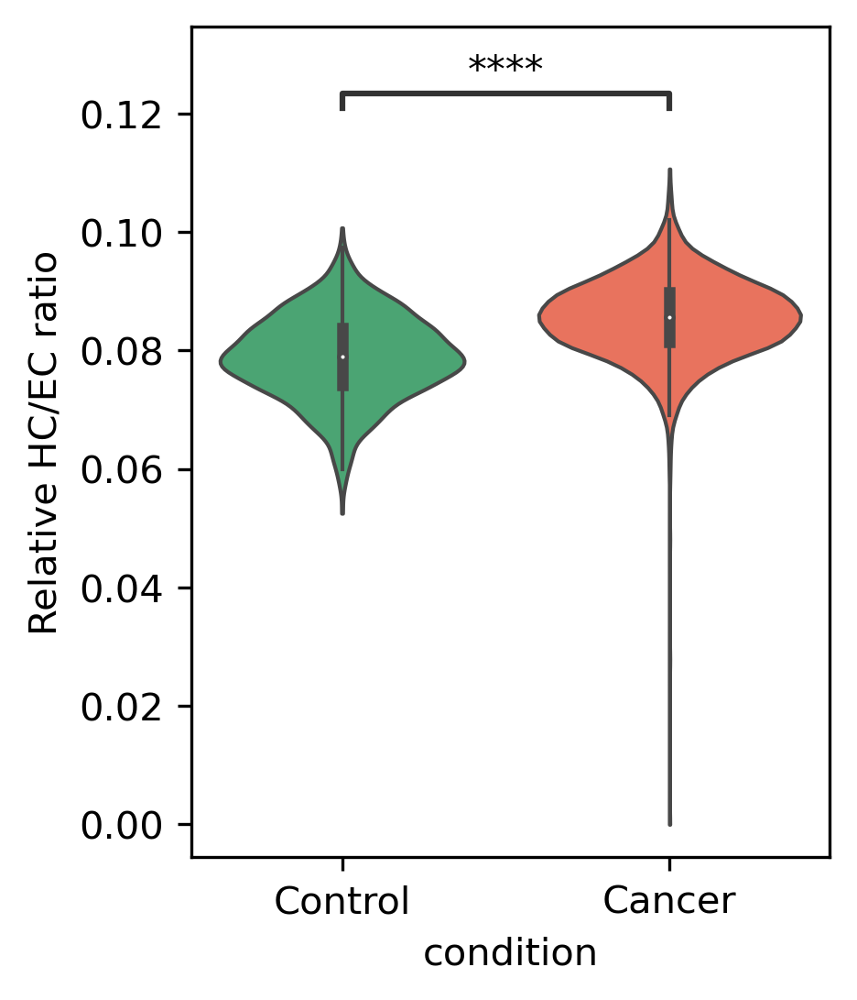

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:8.031e-225 t=-3.476e+01


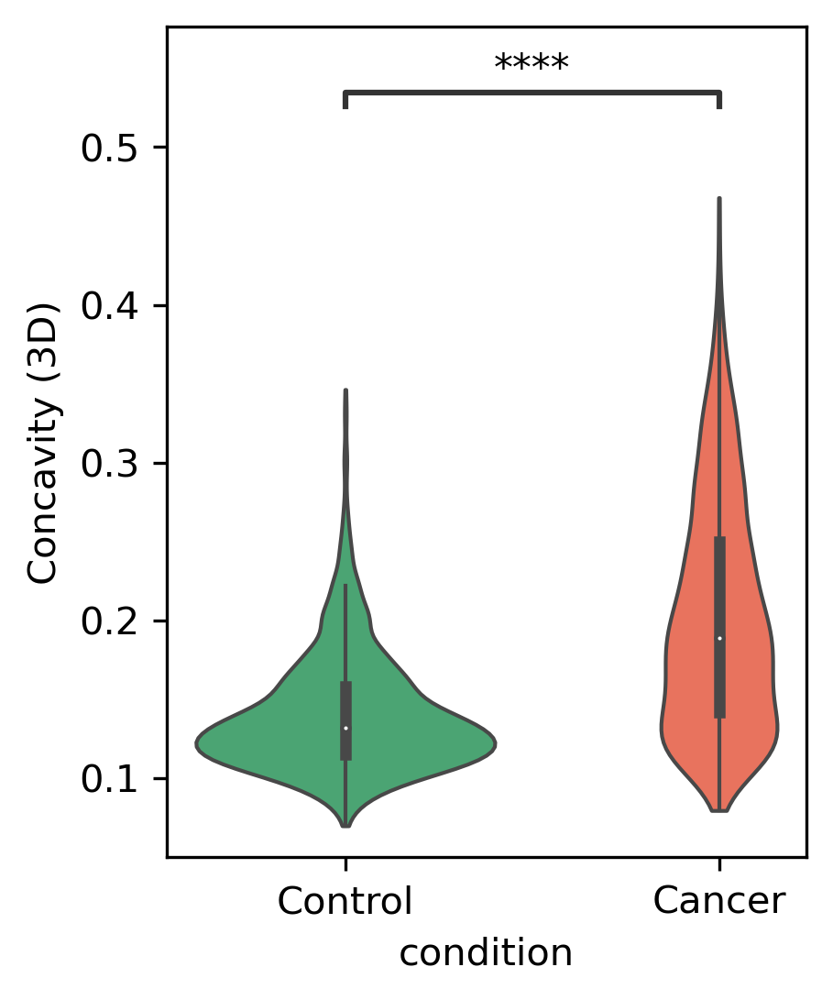

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:3.309e-63 t=1.708e+01


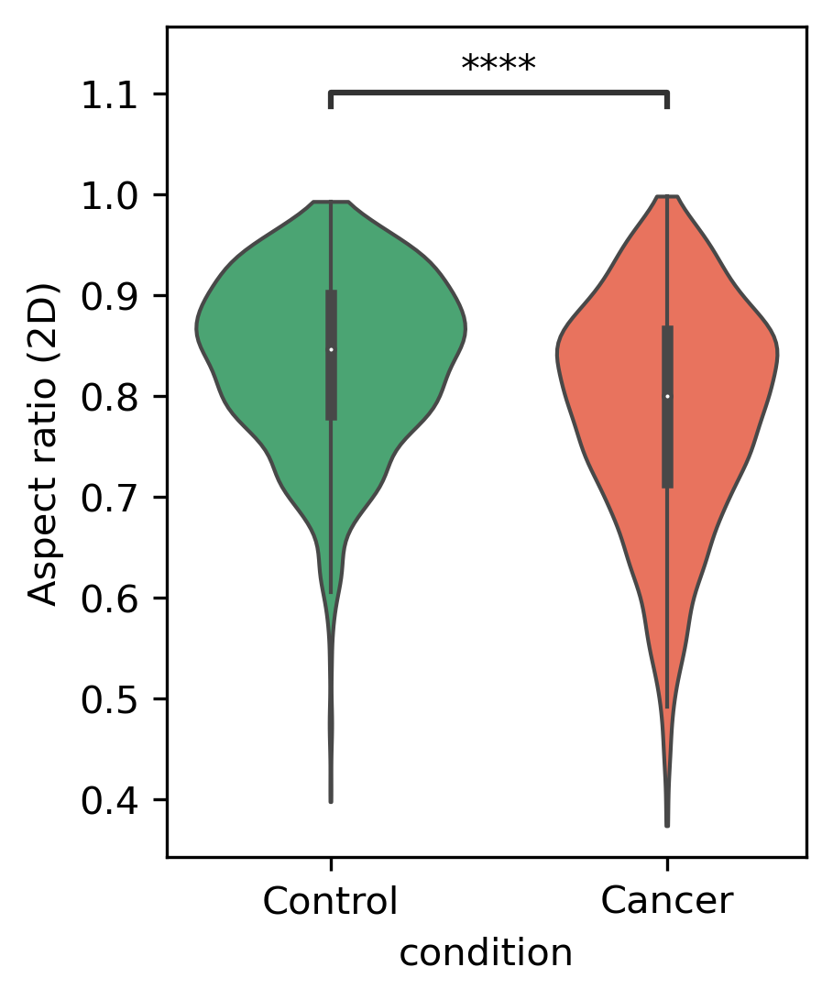

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:6.442e-123 t=-2.437e+01


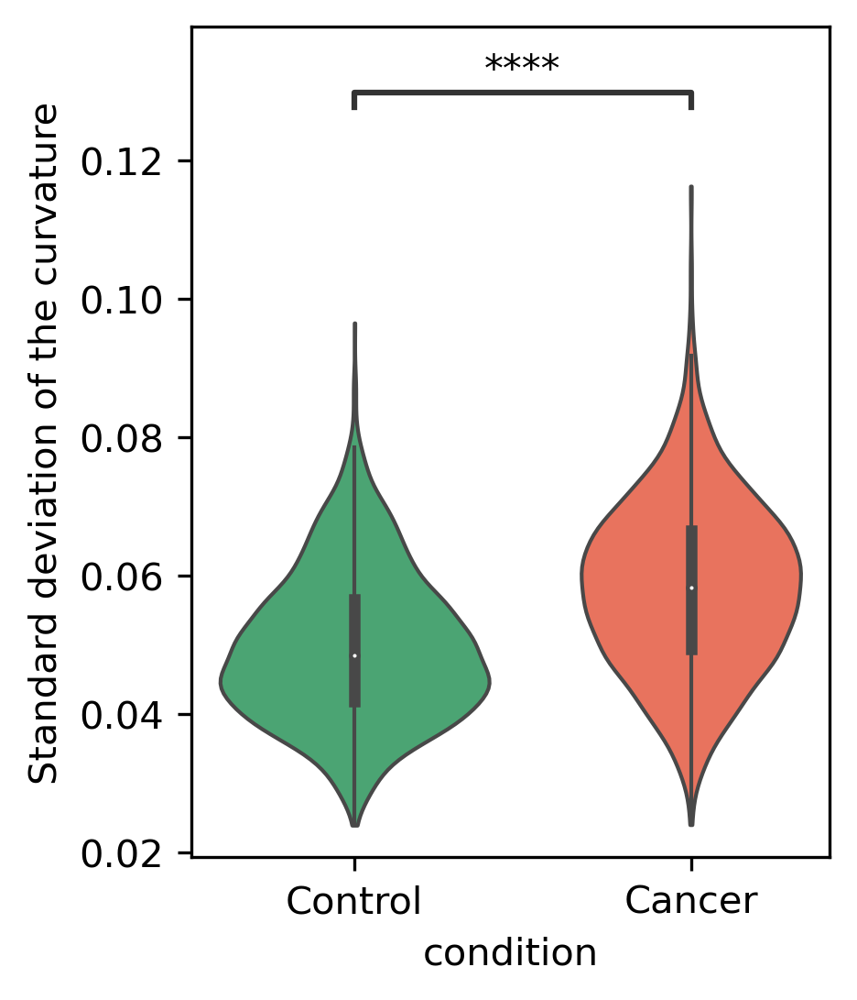

<IPython.core.display.Javascript object>

In [174]:
markers = [
    "volume",
    "hetero_to_euchromatin_volume_ratio",
    "concavity_3d",
    "aspect_ratio",
    "std_curvature",
]
marker_labels = [
    r"Nuclear volume in px$^3$",
    "Relative HC/EC ratio",
    "Concavity (3D)",
    "Aspect ratio (2D)",
    "Standard deviation of the curvature",
    "Kurtosis of the DNA\n intensity distribution (2D)",
]
plot_ctrl_cancer_markers_dist(
    data, markers, marker_labels, cut=0, palette=color_palette
)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:5.404e-74 t=-1.858e+01


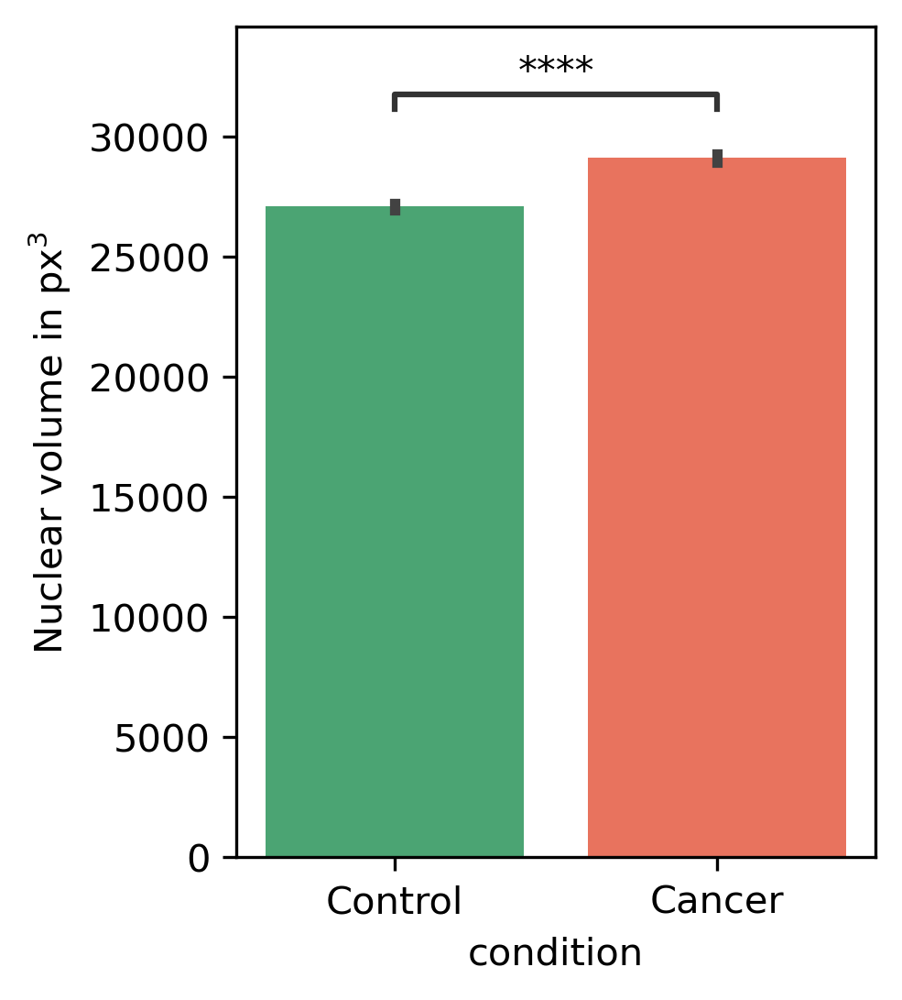

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:3.846e-195 t=-3.141e+01


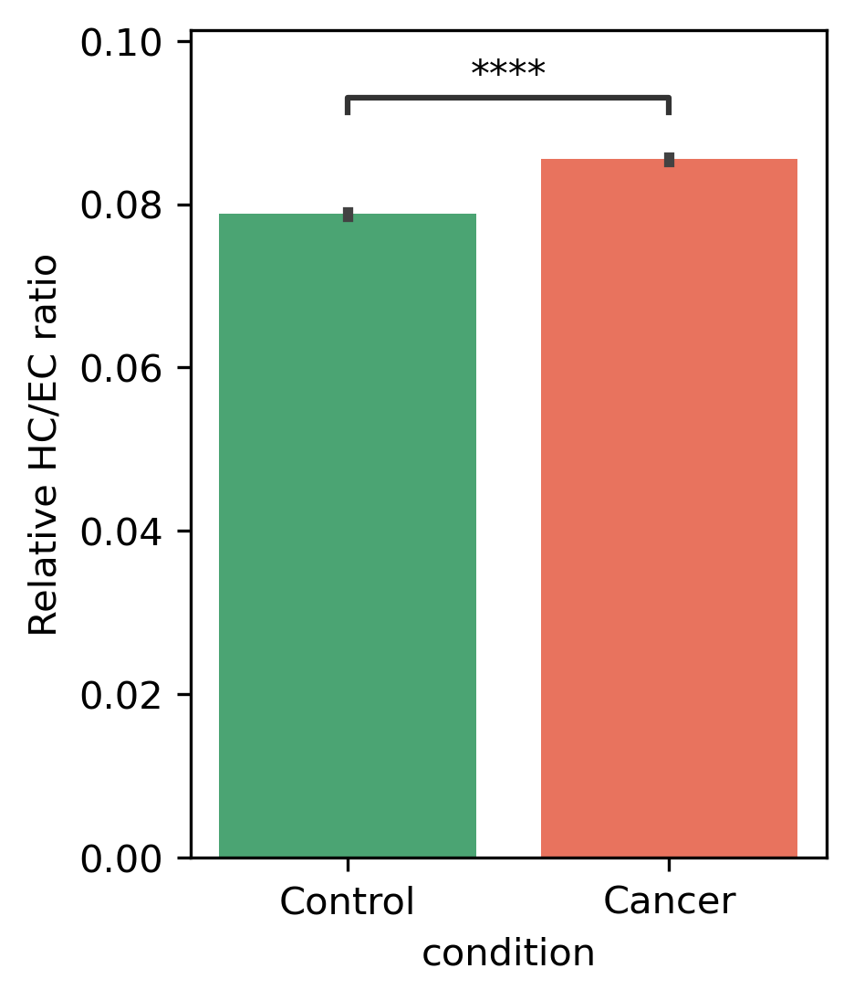

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:8.031e-225 t=-3.476e+01


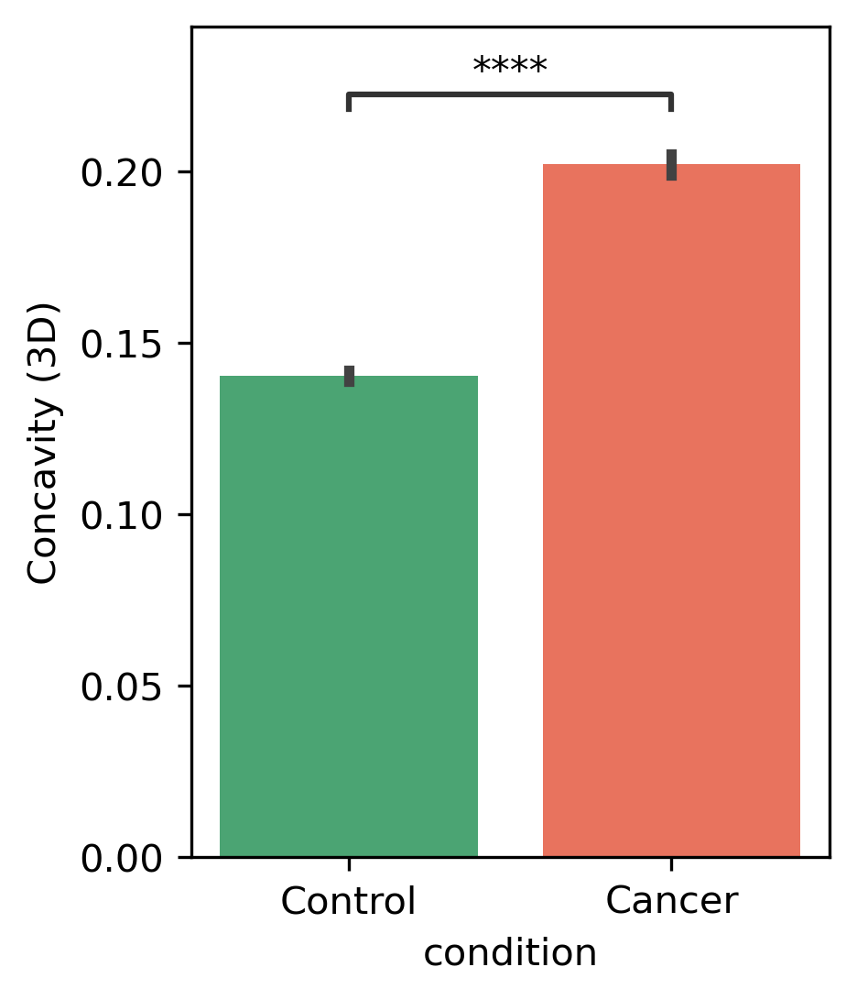

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:3.309e-63 t=1.708e+01


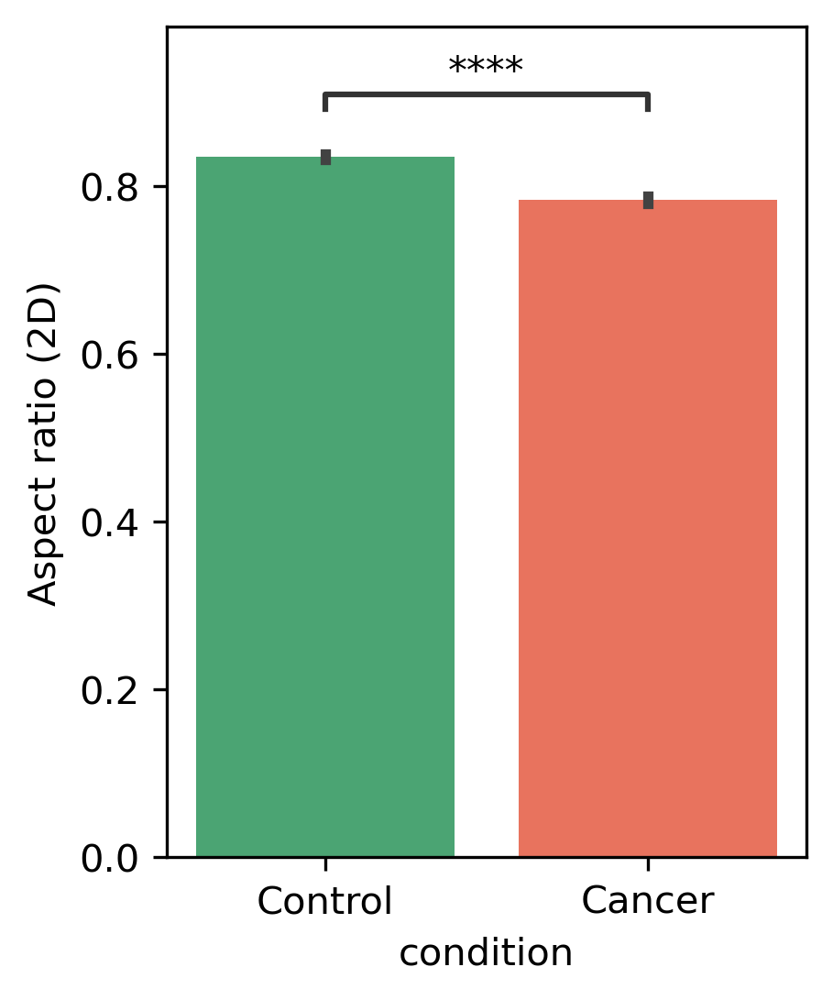

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:6.442e-123 t=-2.437e+01


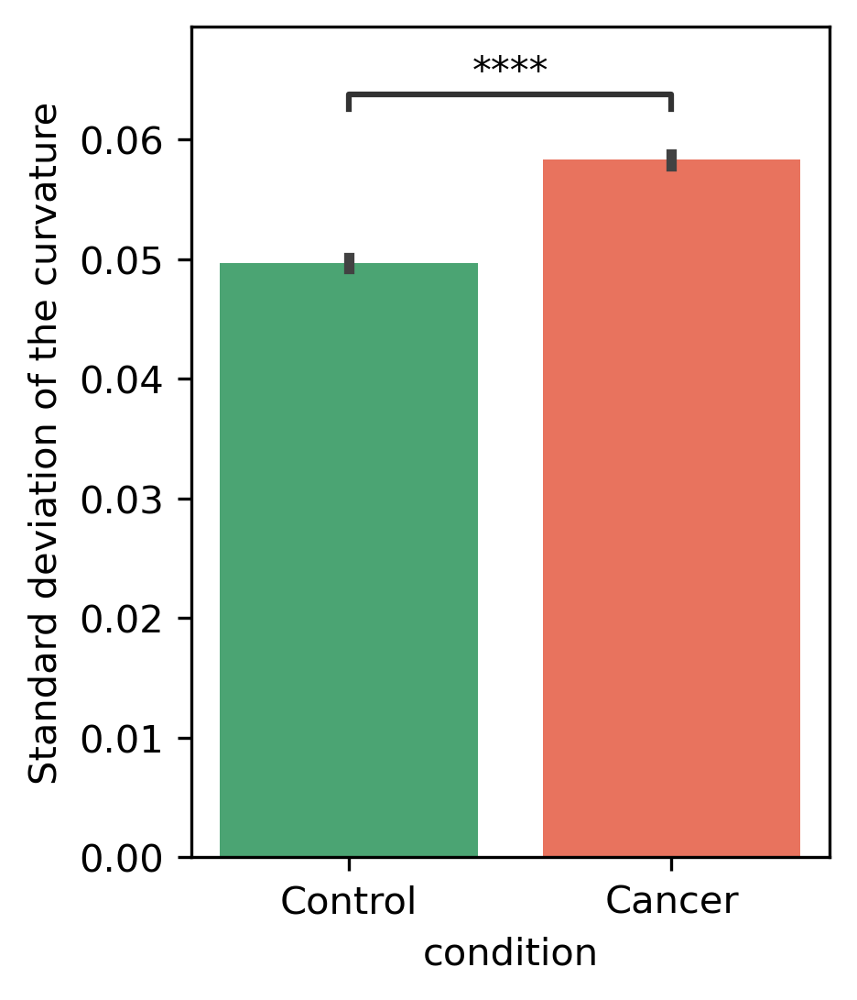

<IPython.core.display.Javascript object>

In [34]:
markers = [
    "volume",
    "hetero_to_euchromatin_volume_ratio",
    "concavity_3d",
    "aspect_ratio",
    "std_curvature",
]
marker_labels = [
    r"Nuclear volume in px$^3$",
    "Relative HC/EC ratio",
    "Concavity (3D)",
    "Aspect ratio (2D)",
    "Standard deviation of the curvature",
    "Kurtosis of the DNA\n intensity distribution (2D)",
]
plot_ctrl_cancer_markers_dist(
    data, markers, marker_labels, cut=0, palette=color_palette, plot_type="bar"
)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC/EC ratio_Control vs. HC/EC ratio_Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:3.846e-195 t=-3.141e+01
Nuclear volume
in px$^3$_Control vs. Nuclear volume
in px$^3$_Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:5.404e-74 t=-1.858e+01
Concavity (3D)_Control vs. Concavity (3D)_Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:8.031e-225 t=-3.476e+01


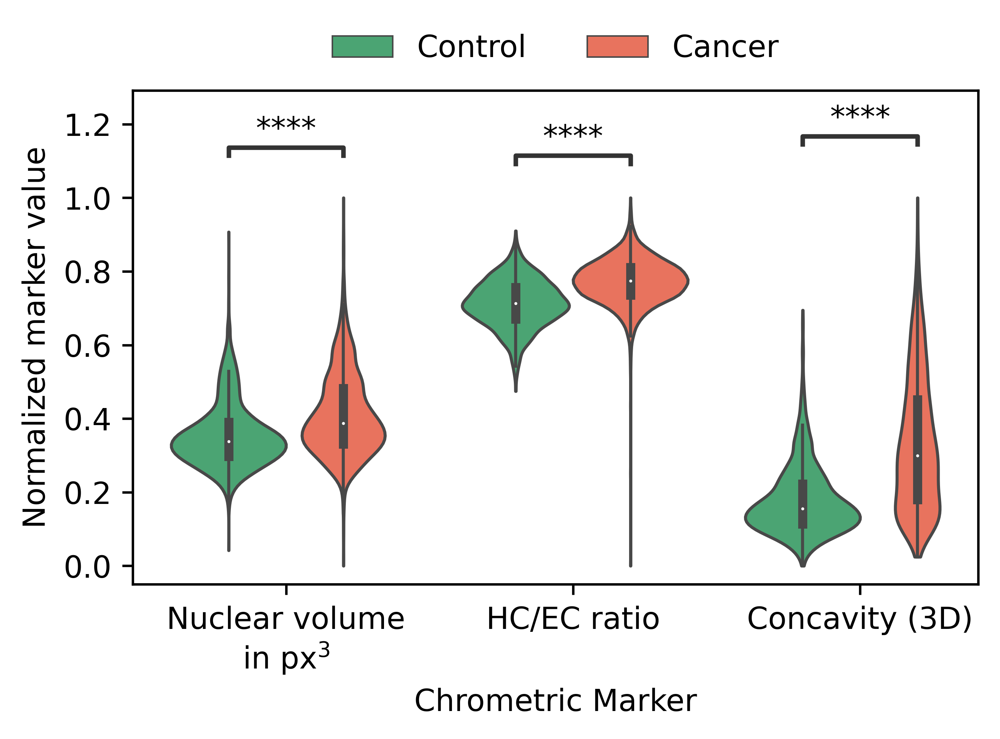

<IPython.core.display.Javascript object>

In [53]:
markers = [
    "volume",
    "hetero_to_euchromatin_volume_ratio",
    "concavity_3d",
]
marker_labels = [
    "Nuclear volume\n" + r"in px$^3$",
    "HC/EC ratio",
    "Concavity (3D)",
]
fig, ax = plot_joint_markers_ctrl_cancer(
    data,
    markers,
    marker_labels,
    figsize=[5, 3],
    cut=0,
    palette=color_palette,
)
ax.set_ylabel("Normalized marker value")
ax.set_xlabel("Chrometric Marker")
sns.move_legend(
    ax,
    "lower center",
    bbox_to_anchor=(0.5, 1),
    ncol=2,
    title=None,
    frameon=False,
)
fig.savefig(
    os.path.join(output_dir, "ctrl_cancer_markers.png"),
    dpi=1200,
    transparent=True,
)
plt.show()

---

### 3d. Proteomic differences of PBMCs in cancer

Finally, we also assess the proteomic differences between the control and cancer populations. To this end, we plot the relative Lamin and gH2AX expression measured by the sum of the intensities of the corresponding imaging channels normalized by the nuclear volume. Additionally, we plot the number of identified gH2AX foci which are computed as the local maxima peaks found in the corresponding channel images.

Note that those features are only available for the first data set that was stained for those proteins.

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:6.293e-44 t=1.415e+01


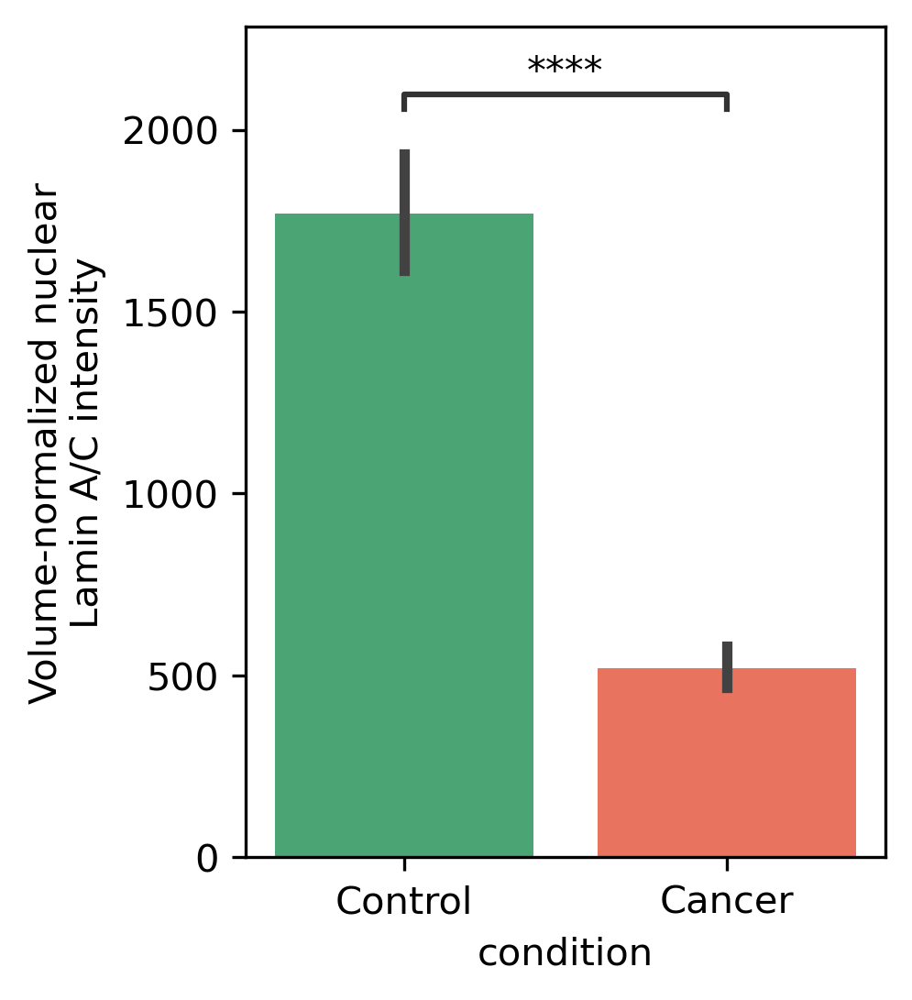

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:3.631e-78 t=1.910e+01


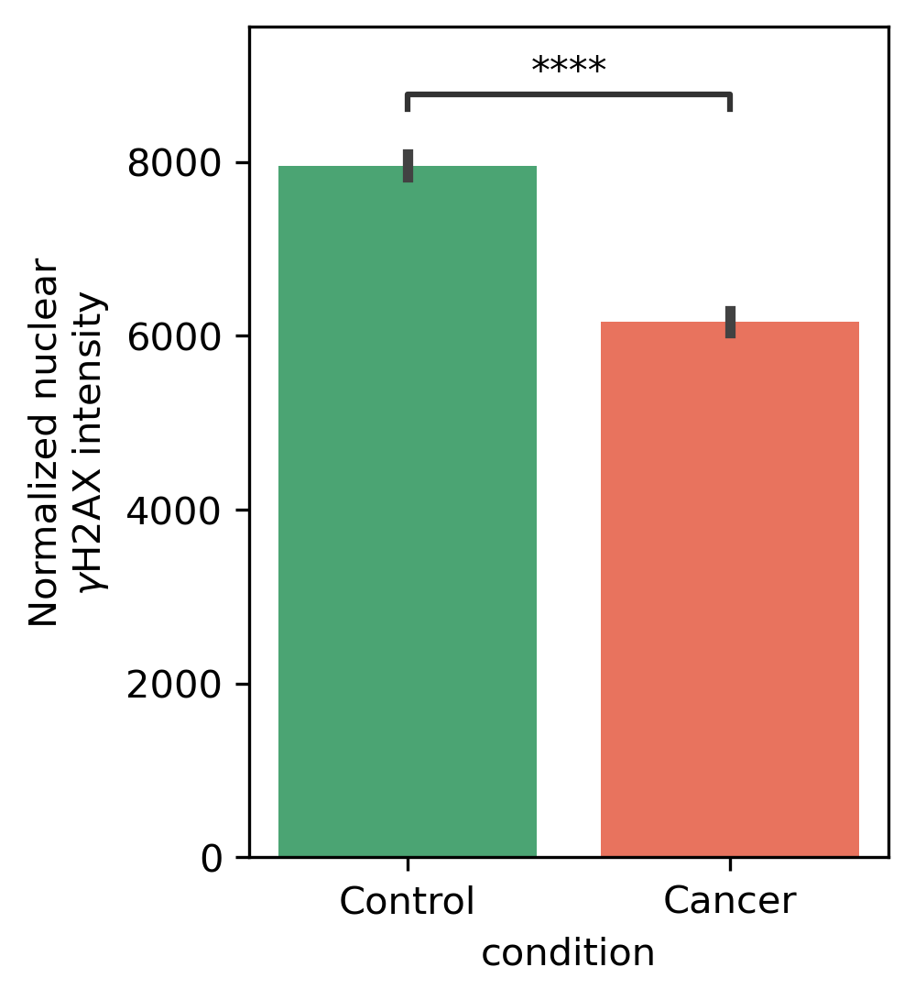

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:7.399e-83 t=-1.971e+01


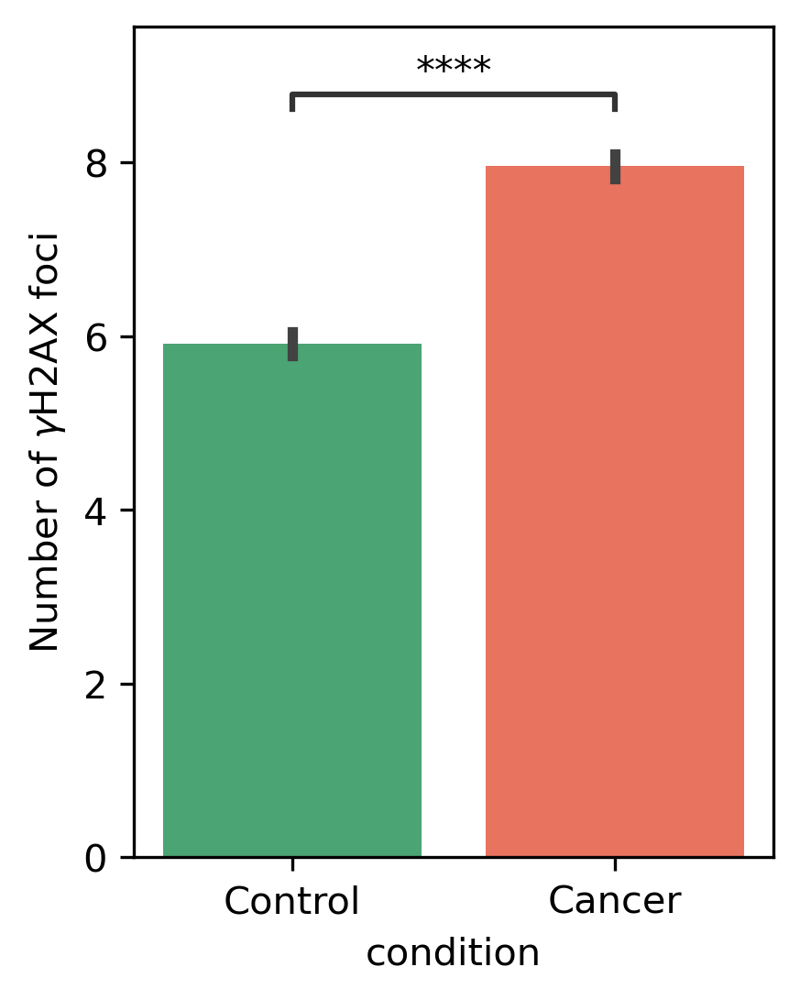

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:8.967e-49 t=-1.487e+01


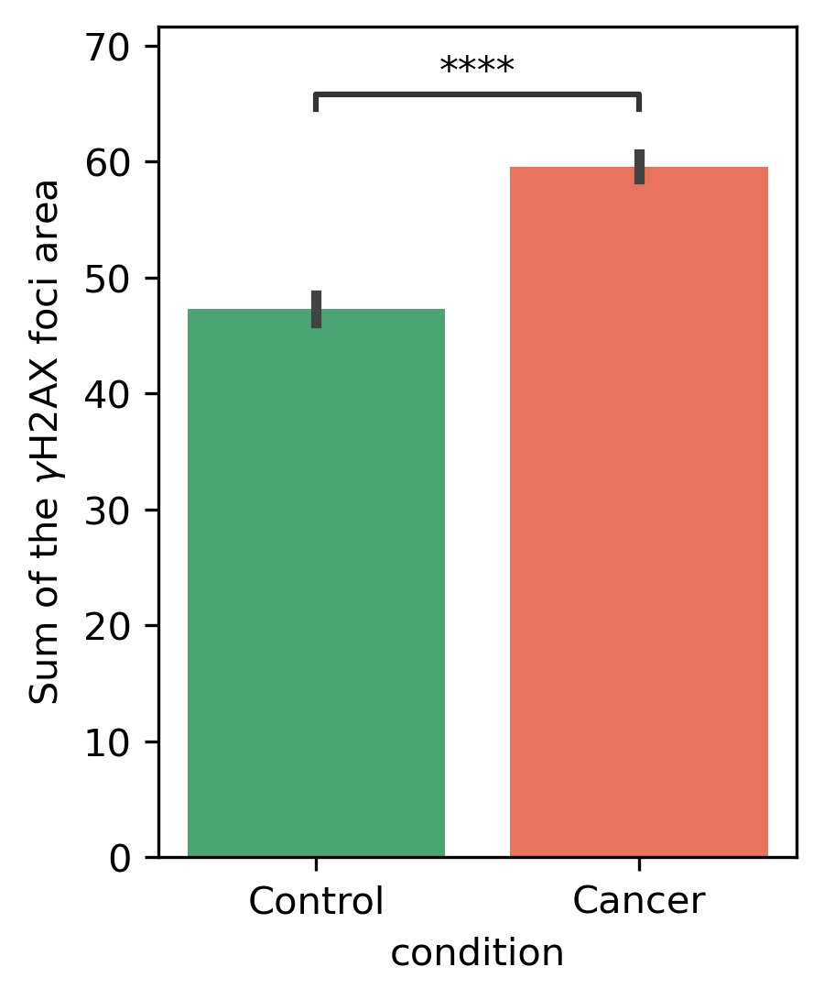

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Control vs. Cancer: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:2.438e-02 t=-2.252e+00


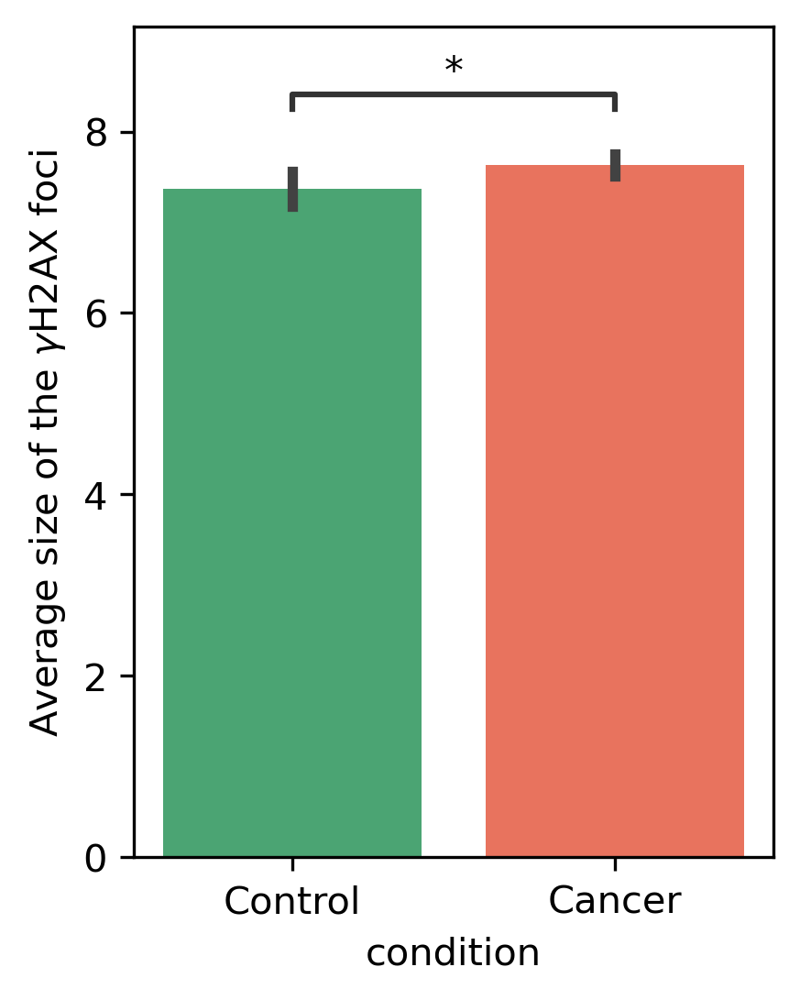

<IPython.core.display.Javascript object>

In [36]:
markers = [
    "rel_lamin_3d_int",
    "rel_gh2ax_3d_int",
    "gh2ax_foci_count",
    "gh2ax_sum_foci_area",
    "gh2ax_avg_foci_area",
]
marker_labels = [
    "Volume-normalized nuclear\nLamin A/C intensity",
    "Normalized nuclear\n" r"$\gamma$H2AX intensity",
    r"Number of $\gamma$H2AX foci",
    r"Sum of the $\gamma$H2AX foci area",
    r"Average size of the $\gamma$H2AX foci",
]
plot_ctrl_cancer_markers_dist(
    data,
    markers,
    marker_labels,
    quantiles=None,
    cut=0,
    plot_type="bar",
    palette=color_palette,
)

---

## 4. Supplemental

In [37]:
age_dict = {
    "hv1": 24,
    "hv2": 33,
    "hv3": 42,
    "hv4": 42,
    "hv5": 60,
    "hv5": 26,
    "hv6": 60,
    "hv7": 32,
    "hv8": 28,
    "hv9": 45,
    "hv10": 35,
}
data["age"] = data.loc[:, "sample"].map(age_dict)

<IPython.core.display.Javascript object>

In [38]:
gender_dict = {
    "hv1": "male",
    "hv2": "male",
    "hv3": "female",
    "hv4": "male",
    "hv5": "male",
    "hv6": "male",
    "hv7": "male",
    "hv8": "female",
    "hv9": "female",
    "hv10": "male",
}
data["gender"] = data.loc[:, "sample"].map(gender_dict)

<IPython.core.display.Javascript object>

In [39]:
data.groupby(["sample", "age"]).mean().loc[
    :, ["gh2ax_foci_count", "gh2ax_sum_foci_area", "gh2ax_avg_foci_area"]
]

,,gh2ax_foci_count,gh2ax_sum_foci_area,gh2ax_avg_foci_area
sample,age,,,
hv1,24.0,4.028112,31.429719,6.249308
hv10,35.0,3.577982,26.587156,5.219174
hv2,33.0,8.182648,68.543379,8.954009
hv3,42.0,7.684211,59.263158,8.415874
hv4,42.0,7.825641,68.430769,9.010829
hv5,26.0,6.644444,53.651852,8.752495
hv6,60.0,7.850746,64.527363,8.848291
hv7,32.0,3.830846,29.422886,5.607166
hv8,28.0,7.411392,57.335443,8.260330


<IPython.core.display.Javascript object>

In [40]:
data.groupby(["sample", "age"]).std().loc[
    :, ["gh2ax_foci_count", "gh2ax_sum_foci_area", "gh2ax_avg_foci_area"]
]

,,gh2ax_foci_count,gh2ax_sum_foci_area,gh2ax_avg_foci_area
sample,age,,,
hv1,24.0,3.395207,27.475284,5.340081
hv10,35.0,3.480806,26.357594,4.088976
hv2,33.0,2.723238,18.575205,3.218657
hv3,42.0,2.448466,17.297405,4.694738
hv4,42.0,2.904025,24.394927,3.505403
hv5,26.0,2.310367,16.378115,3.658064
hv6,60.0,2.701409,20.281531,4.900330
hv7,32.0,3.495890,27.576897,4.500331
hv8,28.0,2.373231,15.759583,3.146597


<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='age', ylabel='gh2ax_foci_count'>

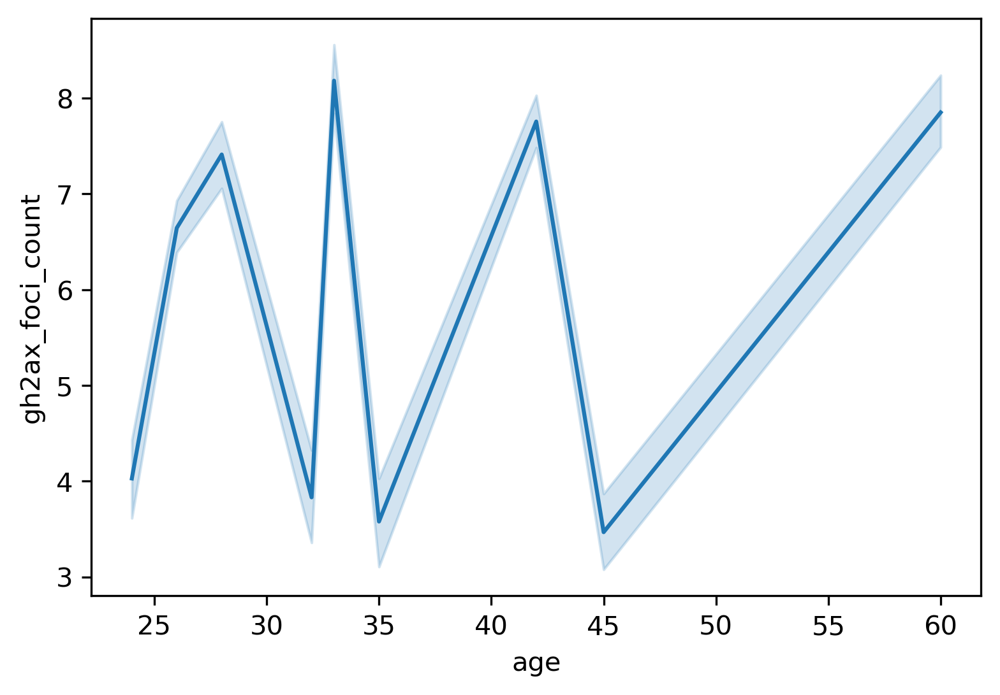

<IPython.core.display.Javascript object>

In [41]:
data["age_group"] = "younger than 35"
data.loc[data.age > 44, "age_group"] = "older than 35"

sns.lineplot(data=data, x="age", y="gh2ax_foci_count")

<AxesSubplot:xlabel='age', ylabel='gh2ax_sum_foci_area'>

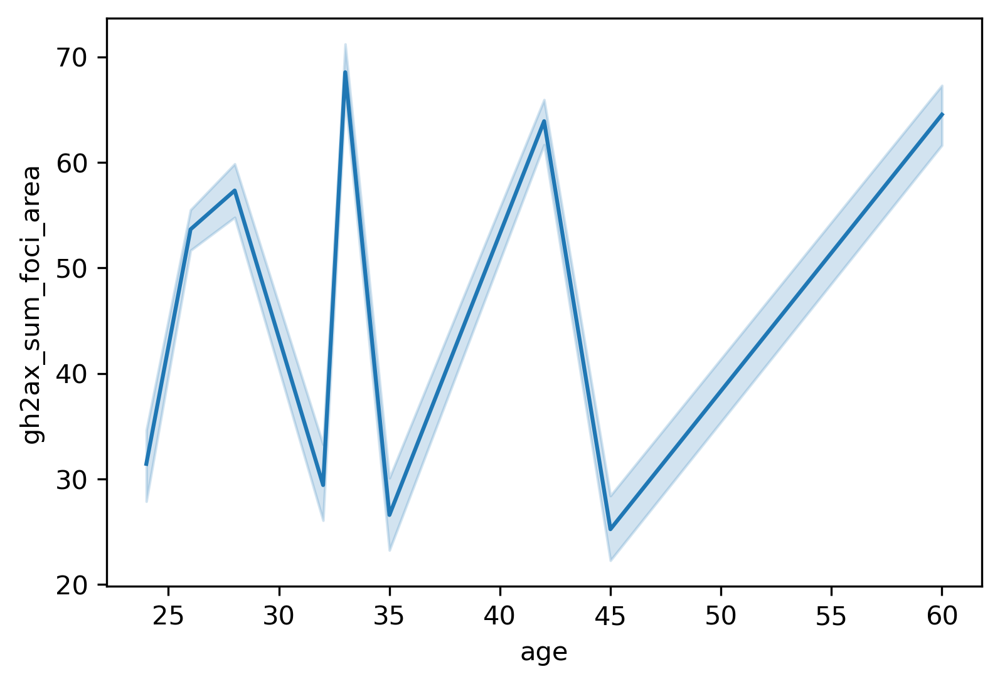

<IPython.core.display.Javascript object>

In [42]:
sns.lineplot(data=data, x="age", y="gh2ax_sum_foci_area")

<AxesSubplot:xlabel='age', ylabel='gh2ax_avg_foci_area'>

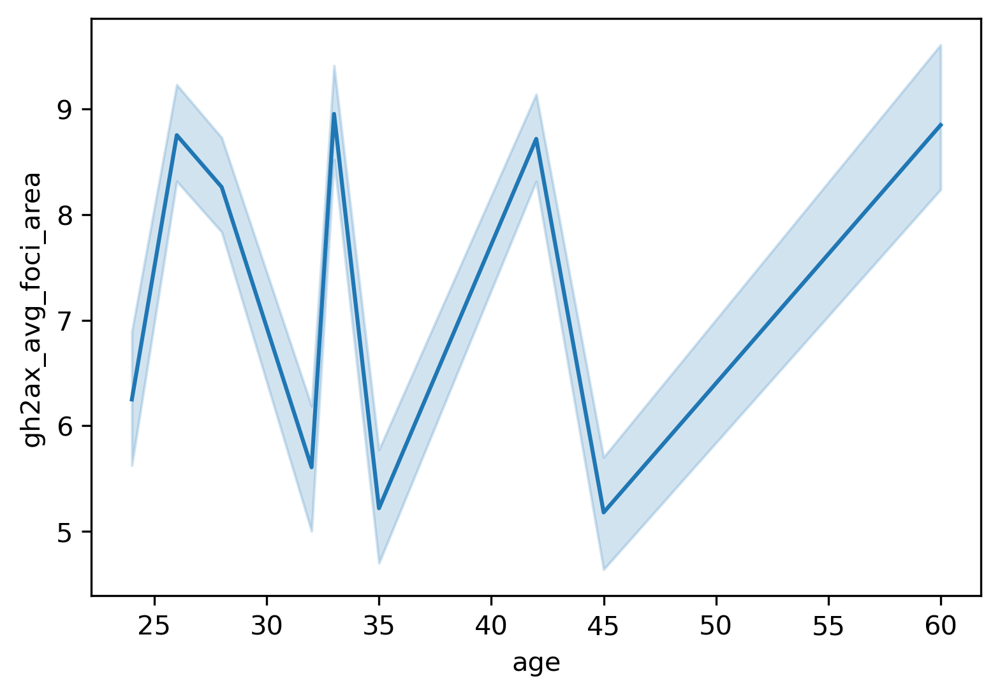

<IPython.core.display.Javascript object>

In [43]:
sns.lineplot(data=data, x="age", y="gh2ax_avg_foci_area")

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

female vs. male: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.119e-01 U_stat=4.628e+05


(<AxesSubplot:xlabel='gender', ylabel='gh2ax_foci_count'>,
 [<statannotations.Annotation.Annotation at 0x7f66bbf21370>])

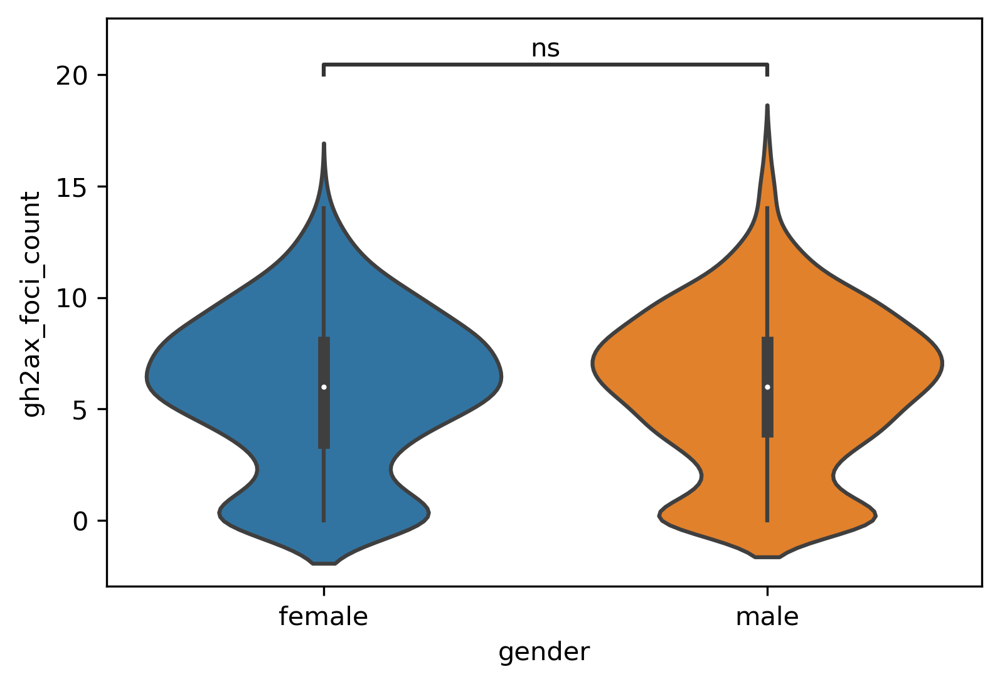

<IPython.core.display.Javascript object>

In [44]:
ax = sns.violinplot(data=data, x="gender", y="gh2ax_foci_count")
annotator = Annotator(
    ax,
    [("male", "female")],
    data=data,
    x="gender",
    y="gh2ax_foci_count",
    plot="violinplot",
)
annotator.configure(
    test="Mann-Whitney",
    text_format="star",
    loc="inside",
    comparisons_correction="Benjamini-Hochberg",
)
annotator.apply_test()
annotator.annotate()